<a href="https://colab.research.google.com/github/Elmir22/Data-science-ML-models-/blob/main/FINAL_PROJECT_Facial_Expression_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#import libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import os
from PIL import Image
from sklearn.metrics import confusion_matrix,classification_report,auc,roc_curve
!pip install visualkeras
import visualkeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 16.7 MB/s eta 0:00:00


#!WGET  Helper_functions

In [2]:
!wget https://raw.githubusercontent.com/Rstam59/TaskDataRepoForStudents/main/helper_functions.py

--2024-08-16 07:14:36--  https://raw.githubusercontent.com/Rstam59/TaskDataRepoForStudents/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0.001s  

2024-08-16 07:14:37 (15.8 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [3]:
from helper_functions import unzip_data, create_tensorboard_callback, plot_loss_curves, compare_historys, walk_through_dir,calculate_results

In [4]:
unzip_data("/content/drive/MyDrive/archive (5).zip")

In [5]:
train_dir = "/content/archive (5)/train"
test_dir = "/content/archive (5)/test"

In [6]:
walk_through_dir("/content/archive (5)/test")

There are 5 directories and 1 images in '/content/archive (5)/test'.
There are 0 directories and 958 images in '/content/archive (5)/test/angry'.
There are 0 directories and 1233 images in '/content/archive (5)/test/neutral'.
There are 0 directories and 1024 images in '/content/archive (5)/test/fear'.
There are 0 directories and 1774 images in '/content/archive (5)/test/happy'.
There are 0 directories and 1247 images in '/content/archive (5)/test/sad'.


In [7]:
walk_through_dir("/content/archive (5)/train")

There are 5 directories and 1 images in '/content/archive (5)/train'.
There are 0 directories and 3995 images in '/content/archive (5)/train/angry'.
There are 0 directories and 4965 images in '/content/archive (5)/train/neutral'.
There are 0 directories and 4097 images in '/content/archive (5)/train/fear'.
There are 0 directories and 7215 images in '/content/archive (5)/train/happy'.
There are 0 directories and 4830 images in '/content/archive (5)/train/sad'.


#to view and display the number of classes

In [8]:
def count_files_in_subdirs(directory, set_name):
    counts = {}
    for item in os.listdir(directory):
        item_path = os.path.join(directory, item)
        if os.path.isdir(item_path):
            counts[item] = len(os.listdir(item_path))
    df = pd.DataFrame(counts, index=[set_name])
    return df

train_count = count_files_in_subdirs(train_dir, 'train')
print(train_count)

test_count = count_files_in_subdirs(test_dir, 'test')
print(test_count)


       angry  neutral  fear  happy   sad
train   3995     4965  4097   7215  4830
      angry  neutral  fear  happy   sad
test    958     1233  1024   1774  1247


In [9]:
train_df = train_count.transpose()
print(train_df)
print("\n")
test_df = test_count.transpose()
print(test_df)

         train
angry     3995
neutral   4965
fear      4097
happy     7215
sad       4830


         test
angry     958
neutral  1233
fear     1024
happy    1774
sad      1247


<Axes: ylabel='train'>

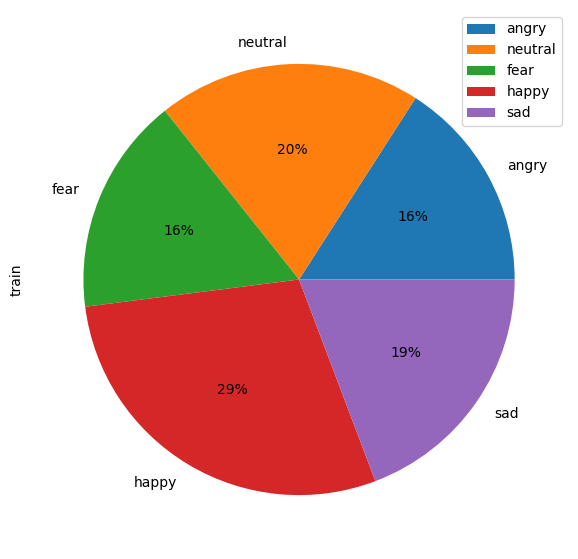

In [10]:
train_df.plot(kind='pie', y='train',autopct='%1.0f%%',figsize=(10,7))

<Axes: >

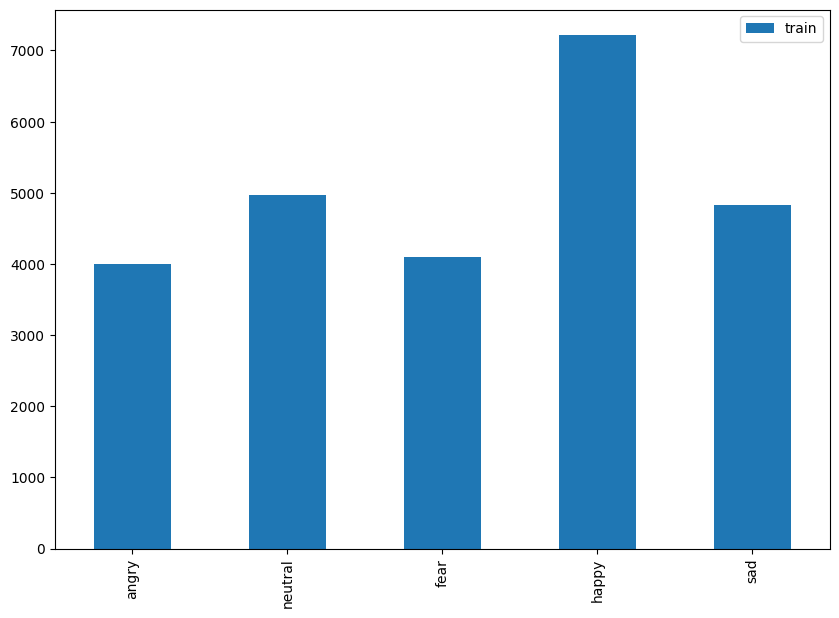

In [11]:
train_df.plot(kind='bar', figsize=(10,7))

<Axes: ylabel='test'>

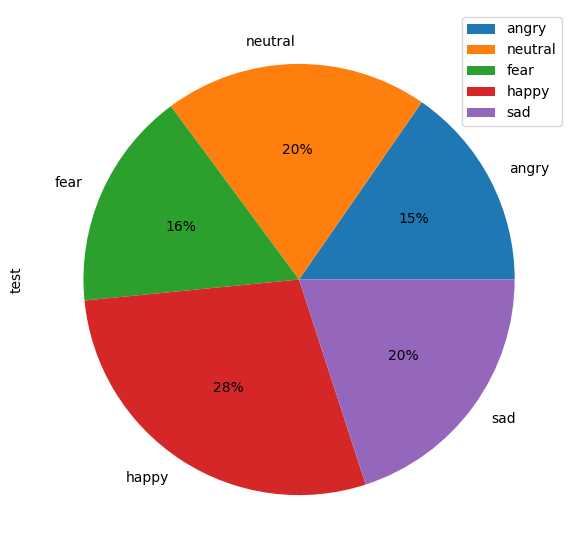

In [12]:
test_df.plot(kind='pie',y='test',autopct='%1.0f%%',figsize=(10,7))

<Axes: >

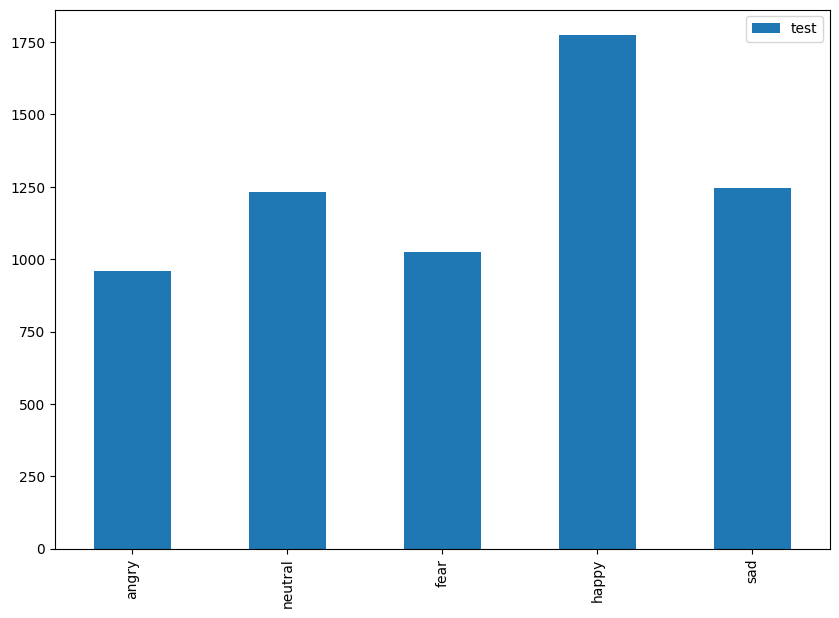

In [13]:
test_df.plot(kind='bar', figsize=(10,7))

#Create DataFrames for Train and Test Data

In [14]:
train_df.reset_index(inplace=True)

In [15]:
train_df.rename(columns={'level_0': 'index','index': 'emotion','train': 'count'}, inplace=True)

In [16]:
train_df

,emotion,count
0,angry,3995
1,neutral,4965
2,fear,4097
3,happy,7215
4,sad,4830


In [17]:
train_df['count'].sum()

25102

In [18]:
test_df.reset_index(inplace=True)

In [19]:
test_df.rename(columns={'index': 'emotion','test': 'count'}, inplace=True)

In [20]:
test_df['count'].sum()

6236

In [21]:
test_df

,emotion,count
0,angry,958
1,neutral,1233
2,fear,1024
3,happy,1774
4,sad,1247


(48, 48)

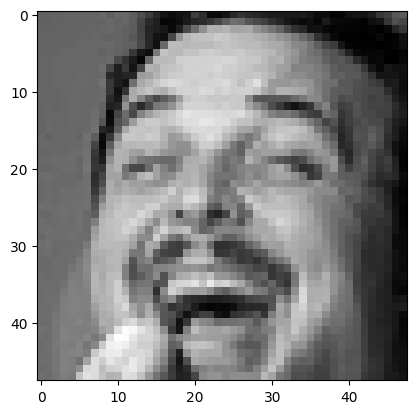

In [23]:
images = "/content/archive (5)/test/happy/PrivateTest_14530913.jpg"
img = plt.imread(images)
plt.imshow(img,cmap='gray')
img.shape

#View all images shape

In [25]:
def view_image_shapes_pillow(directory):
    image_shapes = []

    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_path = os.path.join(root, file)
                with Image.open(image_path) as img:
                    shape = img.size + (len(img.getbands()),)
                    image_shapes.append((image_path, shape))
                    print(f"{image_path}: {shape}")

    return image_shapes


image_shapes = view_image_shapes_pillow(train_dir)


Streaming output truncated to the last 5000 lines.
/content/archive (5)/train/happy/Training_16020643.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_73990027.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_39454711.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_27504789.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_18925796.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_10116721.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_2734418.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_76603658.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_68921788.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_6100096.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_62442831.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_76356287.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_40636222.jpg: (48, 48, 1)
/content/archive (5)/train/happy/Training_18746307.jpg: (48, 48, 1)

In [26]:
def view_image_shapes_pillow(directory):
    image_shapes = []

    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_path = os.path.join(root, file)
                with Image.open(image_path) as img:
                    shape = img.size + (len(img.getbands()),)
                    image_shapes.append((image_path, shape))
                    print(f"{image_path}: {shape}")

    return image_shapes


image_shapes = view_image_shapes_pillow(test_dir)


Streaming output truncated to the last 5000 lines.
/content/archive (5)/test/neutral/PrivateTest_18381227.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PublicTest_93816871.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PublicTest_48457790.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PublicTest_97265242.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PublicTest_7173587.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PublicTest_43477229.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PublicTest_61328272.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PublicTest_14132514.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PrivateTest_55312698.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PrivateTest_29684741.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PublicTest_6008295.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PrivateTest_88005682.jpg: (48, 48, 1)
/content/archive (5)/test/neutral/PrivateTest_70574500.jpg: (48, 48, 1)
/content/archive (5)/te

# Show all emotions

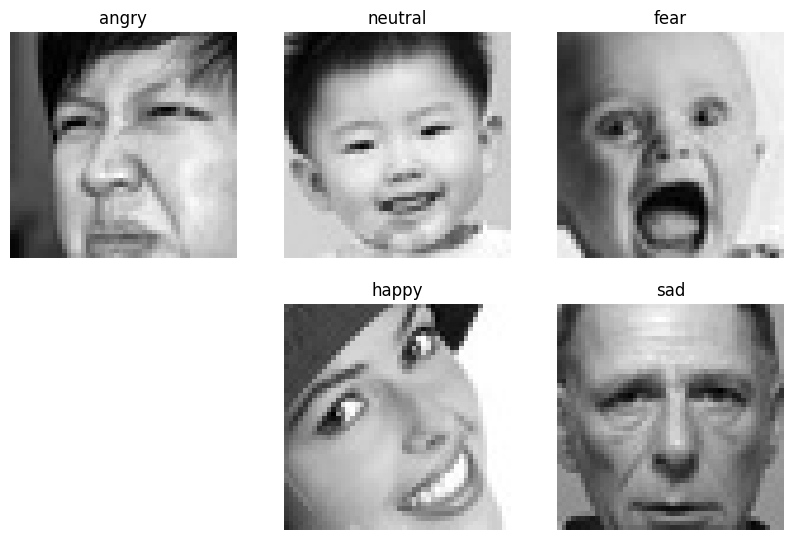

In [27]:
emotions = os.listdir(train_dir)
plt.figure(figsize=(10,10))

for i, emotion in enumerate(emotions, 1):
    if emotion == '.DS_Store':
        continue
    folder = os.path.join(train_dir, emotion)
    img_path = os.path.join(folder, os.listdir(folder)[30])
    img = plt.imread(img_path)
    plt.subplot(3, 3, i)
    plt.imshow(img, cmap='gray')
    plt.title(emotion)
    plt.axis('off')

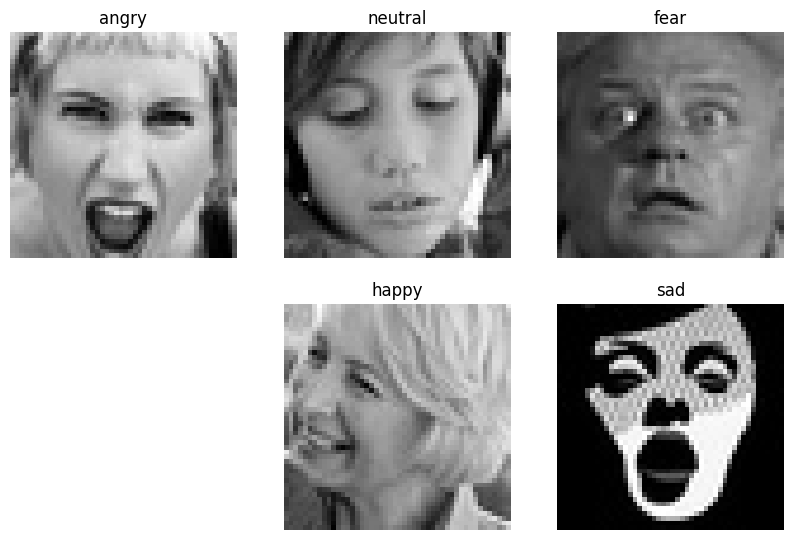

In [28]:
emotions = os.listdir(test_dir)
plt.figure(figsize=(10,10))

for i, emotion in enumerate(emotions, 1):
    if emotion == '.DS_Store':
        continue
    folder = os.path.join(test_dir, emotion)
    img_path = os.path.join(folder, os.listdir(folder)[22])
    img = plt.imread(img_path)
    plt.subplot(3, 3, i)
    plt.imshow(img, cmap='gray')
    plt.title(emotion)
    plt.axis('off')

#data augmentation

In [38]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_data_aug = ImageDataGenerator(rescale=1/255.,
                                    rotation_range=30,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    zoom_range=0.2,
                                    shear_range=0.2,
                                    horizontal_flip=True)


valid_data_aug = ImageDataGenerator(rescale=1/255.,
                                   validation_split=0.2)


test_data_aug = ImageDataGenerator(rescale=1/255.)

In [39]:
train_data = train_data_aug.flow_from_directory(directory=train_dir,
                                                target_size=(48,48),
                                                batch_size=64,
                                                color_mode='grayscale',
                                                class_mode='categorical',
                                                subset='training')


valid_data = valid_data_aug.flow_from_directory(directory=train_dir,
                                                target_size=(48,48),
                                                batch_size=64,
                                                color_mode='grayscale',
                                                class_mode='categorical',
                                                subset='validation',
                                                shuffle=False)


test_data = test_data_aug.flow_from_directory(directory=test_dir,
                                                target_size=(48,48),
                                                batch_size=64,
                                                shuffle=False,
                                                color_mode='grayscale',
                                                class_mode='categorical')


Found 25102 images belonging to 5 classes.
Found 5020 images belonging to 5 classes.
Found 6236 images belonging to 5 classes.


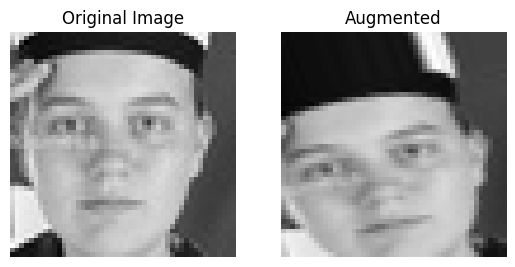

In [40]:
import random
import matplotlib.pyplot as plt
import os

# Choose a random image from the training directory
random_folder = random.choice(os.listdir(train_dir))
random_file = random.choice(os.listdir(os.path.join(train_dir, random_folder)))
random_image_path = os.path.join(train_dir, random_folder, random_file)

# Load the original image
img = plt.imread(random_image_path)

# Preprocess the image to match the ImageDataGenerator's input format
img_array = img.reshape((1,) + img.shape + (1,))  # Add batch and channel dimensions
img_array = img_array / 255.0  # Rescale pixel values

# Apply augmentations to the image using the ImageDataGenerator
augmented_images = train_data_aug.flow(img_array, batch_size=1)
augmented_img = next(augmented_images)[0]  # Get the first (and only) augmented image

# Display the original and augmented images
plt.subplot(1,2,1)
plt.imshow(img,cmap='gray')
plt.title('Original Image')
plt.axis(False)

plt.subplot(1,2,2)
plt.imshow(augmented_img,cmap='gray')
plt.title('Augmented')
plt.axis(False)
plt.show()

In [35]:
20082/32

627.5625

In [41]:
1244/32

38.875

In [42]:
len(train_data)

393

In [43]:
len(valid_data)

79

In [44]:
len(test_data)

98

#Create first model

In [ ]:
model_0 = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(48,48,1)),
    tf.keras.layers.Conv2D(16, kernel_size=(3,3), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(16, kernel_size=(3,3), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(128, kernel_size=(3,3), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(128, kernel_size=(3,3), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(256, kernel_size=(3,3), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(256, kernel_size=(3,3), activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(128, activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.Dense(5, activation='softmax')
])

In [ ]:
model_0.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 16)        160       
                                                                 
 batch_normalization (Batch  (None, 46, 46, 16)        64        
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 44, 44, 16)        2320      
                                                                 
 batch_normalization_1 (Bat  (None, 44, 44, 16)        64        
 chNormalization)                                                
                                                                 
 conv2d_2 (Conv2D)           (None, 42, 42, 32)        4640      
                                                                 
 batch_normalization_2 (Bat  (None, 42, 42, 32)        1

#Learning rate schedule

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.0003,
    decay_steps=100000,
    decay_rate=0.96,
    staircase=True)

#model_0 compile

In [ ]:
model_0.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),
                metrics=['accuracy'])

#Create checkpoint_callback

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint_callback = ModelCheckpoint(
    filepath='best_model_0.keras',  # Change the file extension to '.keras'
    monitor='val_accuracy',
    save_best_only=True,
    save_weights_only=False,
    mode='max',
    verbose=1
)

# Advanced Visualization With Visualkeras

In [ ]:
# import visualkeras
# from PIL import ImageFont

# # Use a custom font for the visualization (optional)
# try:
#     font = ImageFont.truetype("arial.ttf", 24)  # You can use any .ttf file
# except IOError:
#     font = None  # Fallback to the default font if the custom font is not found

# # Customize the appearance
# visualkeras.layered_view(
#     model_0,
#     to_file='advanced_model.png',  # Save to file
#     legend=True,  # Show layer types legend
#     font=font,  # Use custom font
#     spacing=40,  # Spacing between layers
#     scale_xy=2,  # Scale x and y axis
#     scale_z=2,  # Scale z axis (depth)
#     one_dim_orientation='x',  # Orientation of 1D layers ('x' or 'y')
#     #color_map=visualkeras.utils.color_maps.google_colorblind()  # Use a custom color map
# ).show()


#fourth model architecture

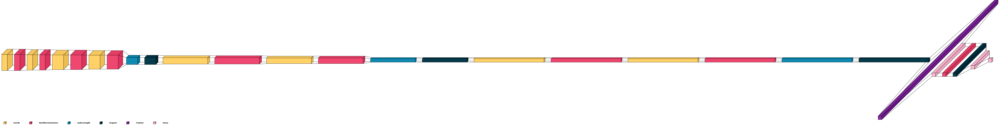

# third model architecture

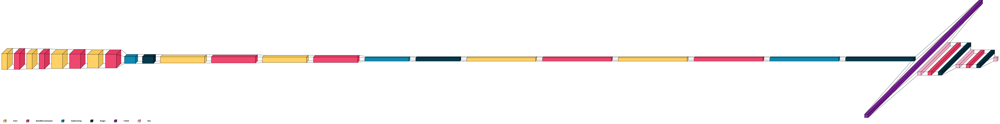

#second model architecture

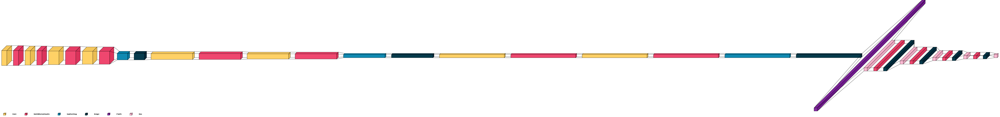

#fisrt model architecture

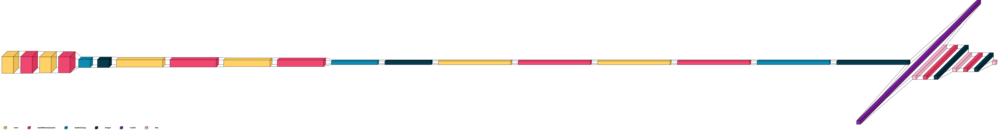

#Simple Visualization

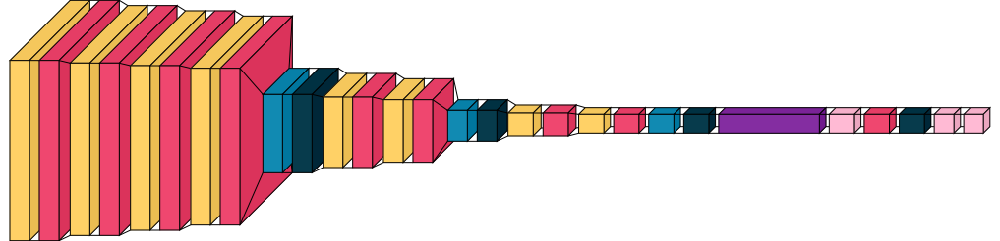

In [ ]:
visualkeras.layered_view(model_0)

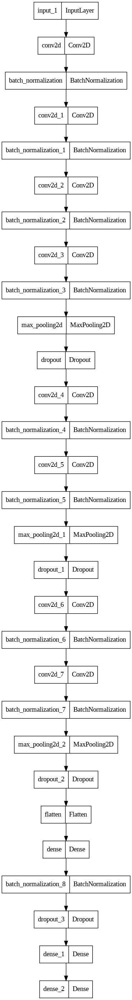

In [ ]:
tf.keras.utils.plot_model(model_0)

#model_0 fit

In [ ]:
history_0 = model_0.fit(train_data,
                        epochs=110,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps=len(valid_data),
                        callbacks=[checkpoint_callback])

Epoch 1/110
785/785 [==============================] - ETA: 0s - loss: 1.7819 - accuracy: 0.2457
Epoch 1: val_accuracy improved from -inf to 0.29343, saving model to best_model_0.h5
785/785 [==============================] - 44s 40ms/step - loss: 1.7819 - accuracy: 0.2457 - val_loss: 1.6218 - val_accuracy: 0.2934
Epoch 2/110


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


784/785 [============================>.] - ETA: 0s - loss: 1.6357 - accuracy: 0.2710
Epoch 2: val_accuracy improved from 0.29343 to 0.29382, saving model to best_model_0.h5
785/785 [==============================] - 29s 36ms/step - loss: 1.6356 - accuracy: 0.2709 - val_loss: 1.5793 - val_accuracy: 0.2938
Epoch 3/110
785/785 [==============================] - ETA: 0s - loss: 1.6088 - accuracy: 0.2785
Epoch 3: val_accuracy improved from 0.29382 to 0.30896, saving model to best_model_0.h5
785/785 [==============================] - 29s 36ms/step - loss: 1.6088 - accuracy: 0.2785 - val_loss: 1.5522 - val_accuracy: 0.3090
Epoch 4/110
784/785 [============================>.] - ETA: 0s - loss: 1.5834 - accuracy: 0.2909
Epoch 4: val_accuracy improved from 0.30896 to 0.31155, saving model to best_model_0.h5
785/785 [==============================] - 29s 36ms/step - loss: 1.5835 - accuracy: 0.2909 - val_loss: 1.5504 - val_accuracy: 0.3116
Epoch 5/110
784/785 [============================>.] - ETA

In [ ]:
model_0.evaluate(valid_data)

157/157 [==============================] - 3s 17ms/step - loss: 0.7370 - accuracy: 0.7149


[0.7369537949562073, 0.7149402499198914]

#Model save

https://journalofbigdata.springeropen.com/articles/10.1186/s40537-021-00444-8

In [ ]:
model_0.save("best_model.keras")

#Model loading

In [ ]:
#reconstructed_model = keras.models.load_model("best_model.keras")

#*plot_loss_curves* to see the loss and accuracy of the model

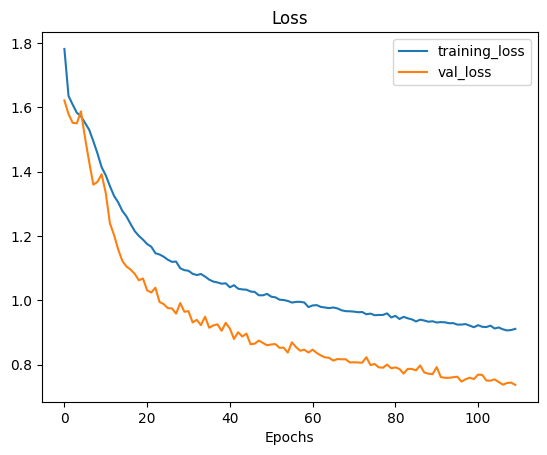

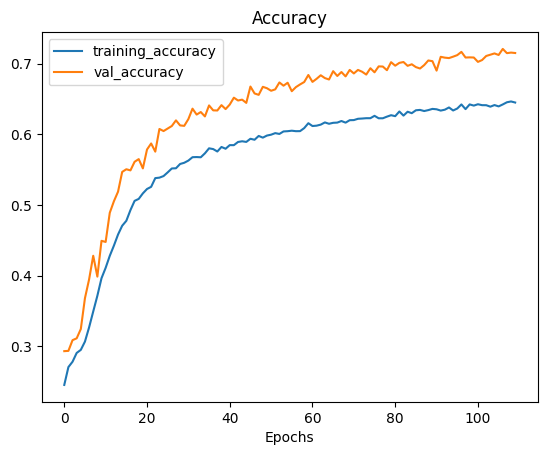

In [ ]:
plot_loss_curves(history_0)

195/195 [==============================] - 2s 11ms/step


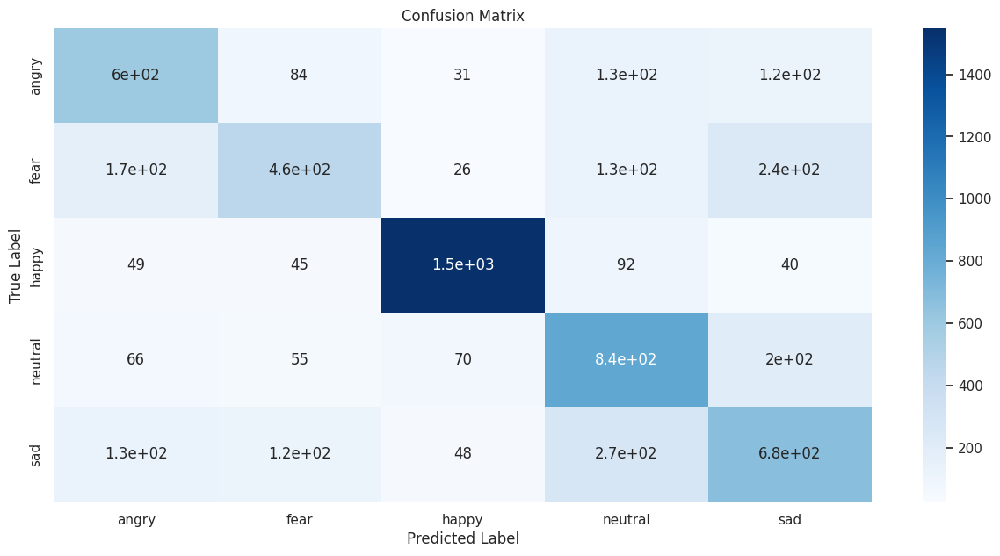

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

validation_labels = test_data.classes
validation_pred_probs = model_0.predict(test_data)
validation_pred_labels = np.argmax(validation_pred_probs, axis=1)

confusion_mtx = confusion_matrix(validation_labels, validation_pred_labels)
class_names = list(train_data.class_indices.keys())
sns.set()
plt.figure(figsize=(15, 7))
sns.heatmap(confusion_mtx, annot=True, cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
class_labels = list(test_data.class_indices.keys())
class_labels

['angry', 'fear', 'happy', 'neutral', 'sad']

In [ ]:
true_classes = test_data.classes
true_classes

array([0, 0, 0, ..., 4, 4, 4], dtype=int32)

In [ ]:
batch_size = 32

predicted_classes = np.argmax(model_0.predict(test_data,
                                            steps=int(np.ceil(test_data.samples/test_data.batch_size))), axis=1)
predicted_classes

195/195 [==============================] - 2s 11ms/step


array([0, 0, 4, ..., 3, 3, 4])

In [ ]:
cm = confusion_matrix(true_classes, predicted_classes)
cm

array([[ 600,   84,   31,  128,  115],
       [ 172,  455,   26,  129,  242],
       [  49,   45, 1548,   92,   40],
       [  66,   55,   70,  840,  202],
       [ 132,  121,   48,  271,  675]])

In [ ]:
report = classification_report(true_classes,
                               predicted_classes,
                               target_names=class_labels,
                               zero_division=0)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

       angry       0.59      0.63      0.61       958
        fear       0.60      0.44      0.51      1024
       happy       0.90      0.87      0.89      1774
     neutral       0.58      0.68      0.62      1233
         sad       0.53      0.54      0.54      1247

    accuracy                           0.66      6236
   macro avg       0.64      0.63      0.63      6236
weighted avg       0.66      0.66      0.66      6236



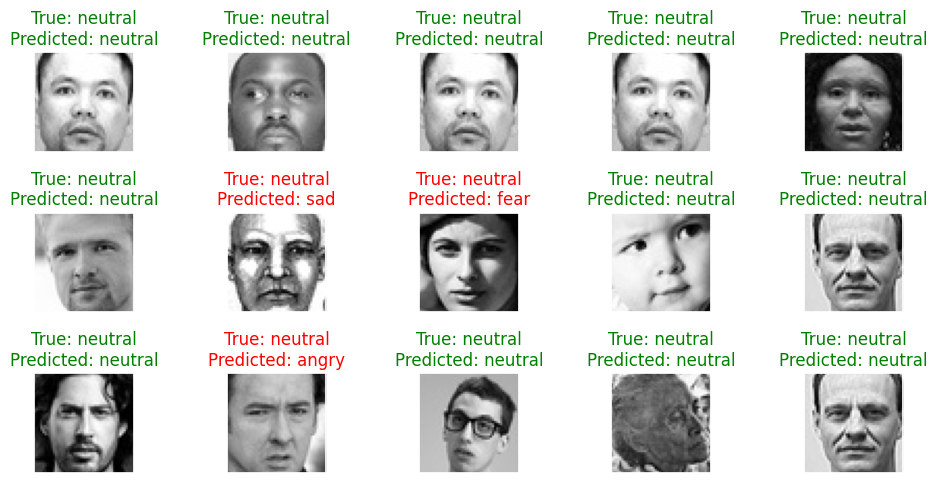

In [ ]:
# Emotion classes for the dataset
Emotion_Classes = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Assuming test_data and model_0 are already defined
batch_size = test_data.batch_size

# Selecting a random batch from the test_data
Random_batch = np.random.randint(0, len(test_data) - 1)

# Selecting random image indices from the batch
Random_Img_Index = np.random.randint(0, batch_size,15)

# Setting up the plot
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(10, 5),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    # Fetching the random image and its label
    Random_Img = test_data[Random_batch][0][Random_Img_Index[i]]
    Random_Img_Label = np.argmax(test_data[Random_batch][1][Random_Img_Index[i]], axis=0)

    # Making a prediction using the model_0
    model_0_Prediction = np.argmax(model_0.predict(tf.expand_dims(Random_Img, axis=0), verbose=0), axis=1)[0]

    # Displaying the image
    ax.imshow(Random_Img.squeeze(), cmap='gray')  # Assuming the images are grayscale
    # Setting the title with true and predicted labels, colored based on correctness
    color = "green" if Emotion_Classes[Random_Img_Label] == Emotion_Classes[model_0_Prediction] else "red"
    ax.set_title(f"True: {Emotion_Classes[Random_Img_Label]}\nPredicted: {Emotion_Classes[model_0_Prediction]}", color=color)

plt.tight_layout()
plt.show()

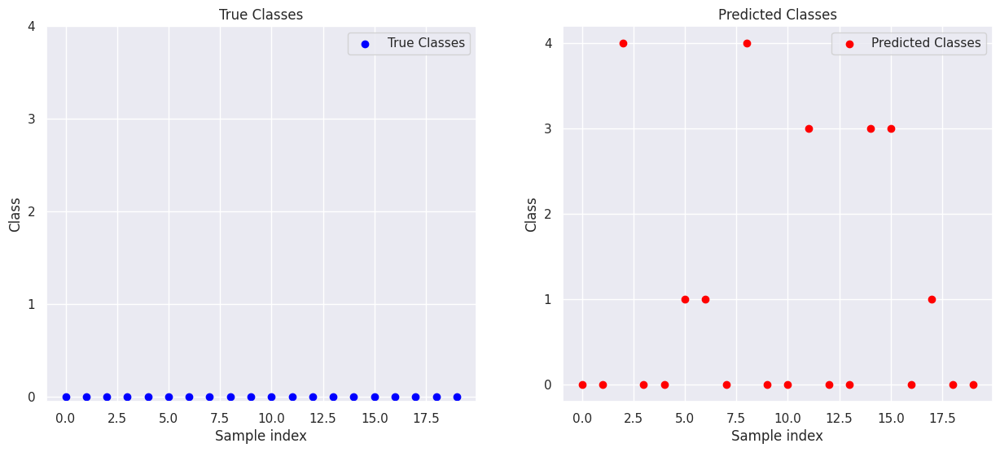

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the number of samples to visualize
num_samples = 20  # You can change this to visualize more or fewer samples

# Create a figure with two subplots
plt.figure(figsize=(15, 6))

# Plot the true classes
plt.subplot(1, 2, 1)
plt.scatter(range(num_samples), true_classes[:num_samples], c='blue', label='True Classes')
plt.title('True Classes')
plt.xlabel('Sample index')
plt.ylabel('Class')
plt.yticks(np.arange(5))  # Assuming 5 classes
plt.legend()

# Plot the predicted classes
plt.subplot(1, 2, 2)
plt.scatter(range(num_samples), predicted_classes[:num_samples], c='red', label='Predicted Classes')
plt.title('Predicted Classes')
plt.xlabel('Sample index')
plt.ylabel('Class')
plt.yticks(np.arange(5))  # Assuming 5 classes
plt.legend()

# Show the plot
plt.show()

#Model_1 The architecture of GoogLeNet

https://www.cv-foundation.org/openaccess/content_cvpr_2015/papers/Szegedy_Going_Deeper_With_2015_CVPR_paper.pdf

#C. Szegedy et al., "Going deeper with convolutions," in 2015 IEEE Conference on Computer Vision and Pattern
#Recognition (CVPR), 2015, pp. 1-9.

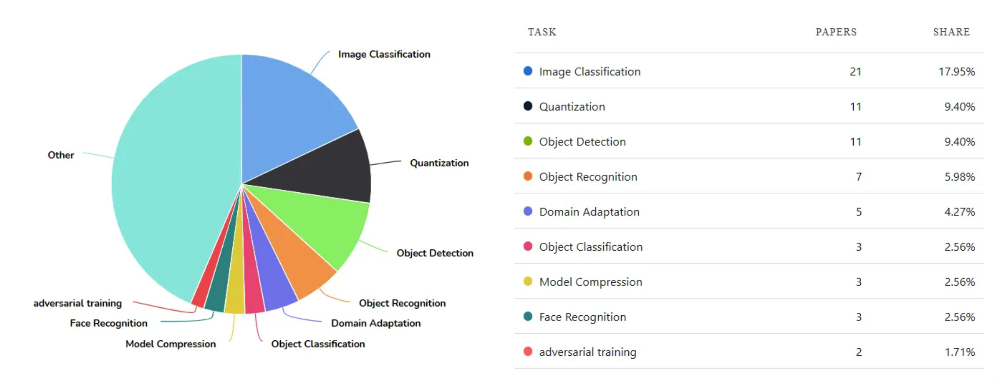

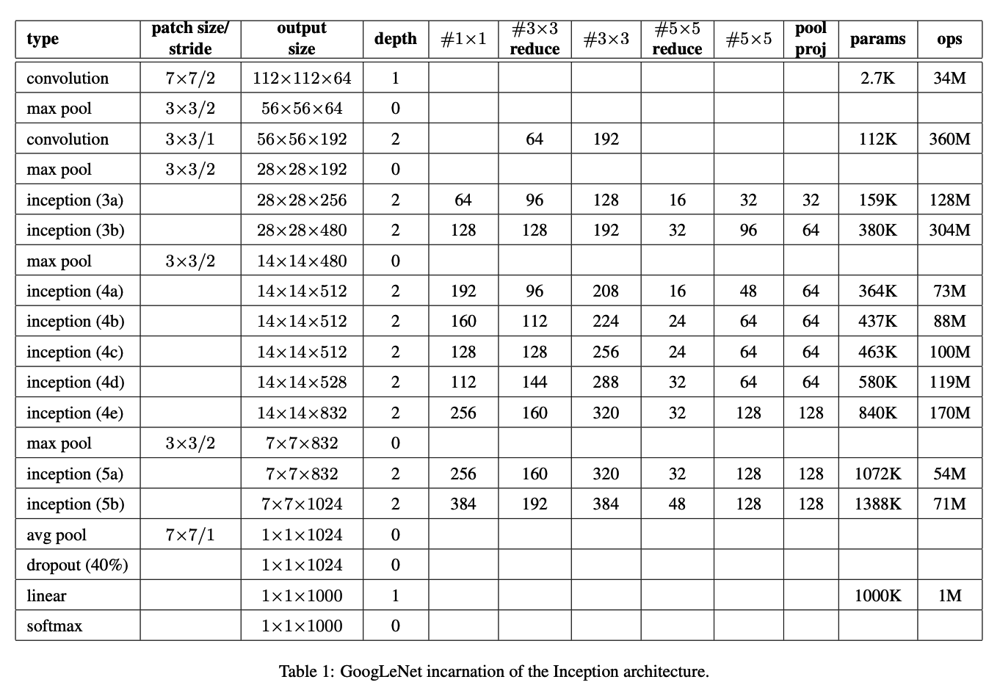

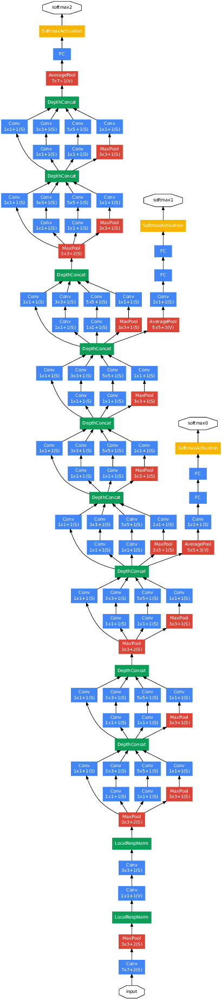

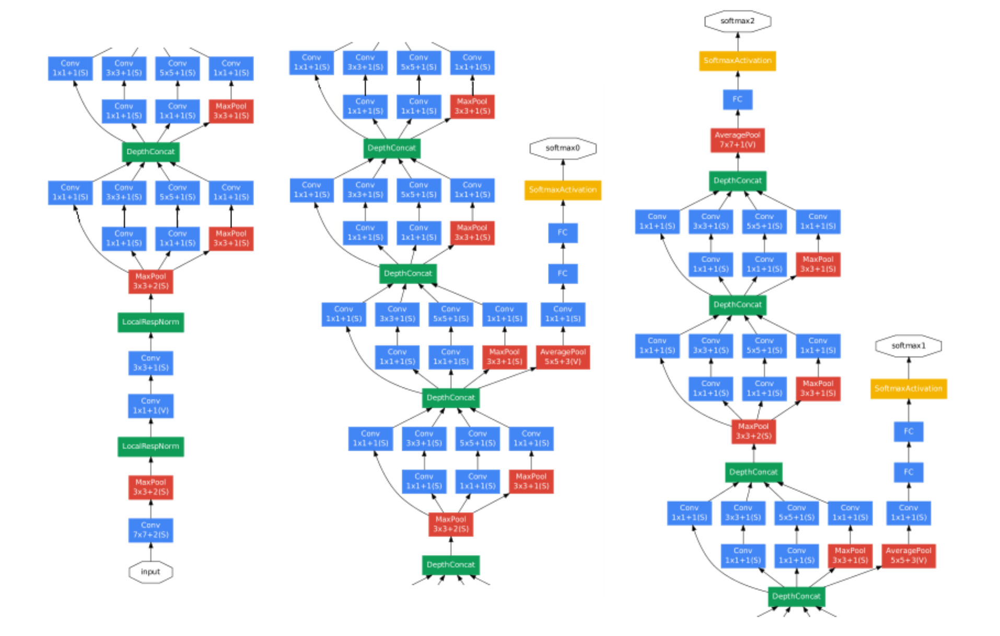

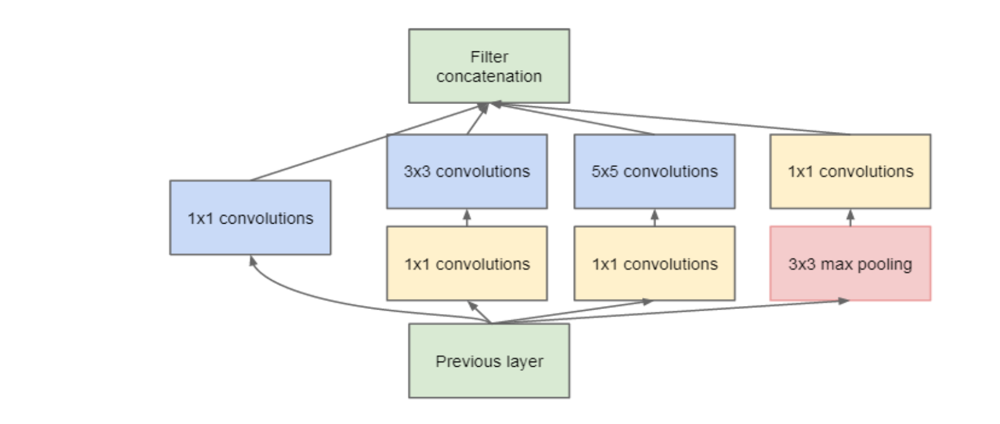

In [ ]:
import tensorflow as tf

def inception_module(x, filters):
    # 1x1 convolution
    conv1x1 = tf.keras.layers.Conv2D(filters[0], (1, 1), padding='same', activation='relu', kernel_initializer='he_normal')(x)

    # 3x3 convolution
    conv3x3 = tf.keras.layers.Conv2D(filters[1], (1, 1), padding='same', activation='relu', kernel_initializer='he_normal')(x)
    conv3x3 = tf.keras.layers.Conv2D(filters[2], (3, 3), padding='same', activation='relu', kernel_initializer='he_normal')(conv3x3)

    # 5x5 convolution
    conv5x5 = tf.keras.layers.Conv2D(filters[3], (1, 1), padding='same', activation='relu', kernel_initializer='he_normal')(x)
    conv5x5 = tf.keras.layers.Conv2D(filters[4], (5, 5), padding='same', activation='relu', kernel_initializer='he_normal')(conv5x5)

    # Max pooling
    maxpool = tf.keras.layers.MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)
    maxpool = tf.keras.layers.Conv2D(filters[5], (1, 1), padding='same', activation='relu', kernel_initializer='he_normal')(maxpool)

    # Concatenate filters
    concat = tf.keras.layers.Concatenate(axis=-1)([conv1x1, conv3x3, conv5x5, maxpool])
    return concat

input_layer = tf.keras.layers.Input(shape=(48, 48, 1))

# Initial layers
x = tf.keras.layers.Conv2D(64, (7, 7), strides=(2, 2), padding='same', activation='relu', kernel_initializer='he_normal')(input_layer)
x = tf.keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)

x = tf.keras.layers.Conv2D(64, (1, 1), padding='same', activation='relu', kernel_initializer='he_normal')(x)
x = tf.keras.layers.Conv2D(192, (3, 3), padding='same', activation='relu', kernel_initializer='he_normal')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

# Inception modules
x = inception_module(x, [64, 96, 128, 16, 32, 32])
x = inception_module(x, [128, 128, 192, 32, 96, 64])
x = tf.keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

x = inception_module(x, [192, 96, 208, 16, 48, 64])
x = inception_module(x, [160, 112, 224, 24, 64, 64])
x = inception_module(x, [128, 128, 256, 24, 64, 64])
x = inception_module(x, [112, 144, 288, 32, 64, 64])
x = inception_module(x, [256, 160, 320, 32, 128, 128])
x = tf.keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

x = inception_module(x, [256, 160, 320, 32, 128, 128])
x = inception_module(x, [384, 192, 384, 48, 128, 128])

# Final layers
x = tf.keras.layers.AveragePooling2D(pool_size=(2, 2), strides=(1, 1))(x)
x = tf.keras.layers.Dropout(0.4)(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(5, activation='softmax')(x)

# Create model_1
model_1 = tf.keras.Model(input_layer, x)

# Compile model_1
model_1.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0003),
                metrics=['accuracy'])

# Print model_1 summary
model_1.summary()


Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 48, 48, 1)]          0         []                            
                                                                                                  
 conv2d_114 (Conv2D)         (None, 24, 24, 64)           3200      ['input_3[0][0]']             
                                                                                                  
 max_pooling2d_26 (MaxPooli  (None, 12, 12, 64)           0         ['conv2d_114[0][0]']          
 ng2D)                                                                                            
                                                                                                  
 batch_normalization_4 (Bat  (None, 12, 12, 64)           256       ['max_pooling2d_26[0][0]

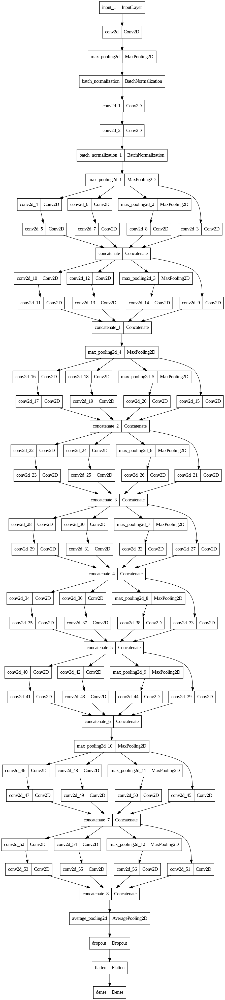

In [ ]:
tf.keras.utils.plot_model(model_1)

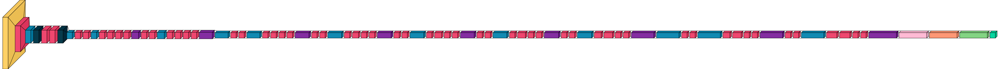

In [ ]:
visualkeras.layered_view(model_1)

In [ ]:
history_1 = model_1.fit(train_data,
                        epochs=40,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps=len(valid_data))

Epoch 1/40
785/785 [==============================] - 34s 44ms/step - loss: 0.9928 - accuracy: 0.6068 - val_loss: 0.9265 - val_accuracy: 0.6375
Epoch 2/40
785/785 [==============================] - 37s 47ms/step - loss: 0.9798 - accuracy: 0.6111 - val_loss: 0.9260 - val_accuracy: 0.6279
Epoch 3/40
785/785 [==============================] - 33s 42ms/step - loss: 0.9813 - accuracy: 0.6122 - val_loss: 1.0233 - val_accuracy: 0.5892
Epoch 4/40
785/785 [==============================] - 34s 43ms/step - loss: 0.9816 - accuracy: 0.6096 - val_loss: 0.9161 - val_accuracy: 0.6325
Epoch 5/40
785/785 [==============================] - 33s 43ms/step - loss: 0.9756 - accuracy: 0.6156 - val_loss: 0.9158 - val_accuracy: 0.6394
Epoch 6/40
785/785 [==============================] - 35s 44ms/step - loss: 0.9685 - accuracy: 0.6193 - val_loss: 0.9166 - val_accuracy: 0.6426
Epoch 7/40
785/785 [==============================] - 36s 46ms/step - loss: 0.9760 - accuracy: 0.6137 - val_loss: 0.8922 - val_accuracy:

In [ ]:
model_1.evaluate(valid_data)

157/157 [==============================] - 2s 14ms/step - loss: 0.9503 - accuracy: 0.6104


[0.9503306150436401, 0.6103585362434387]

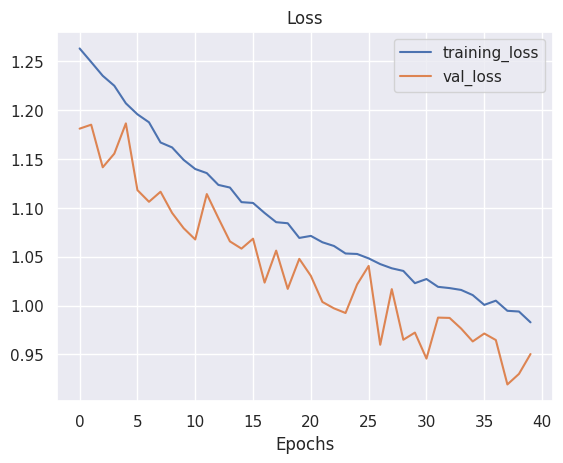

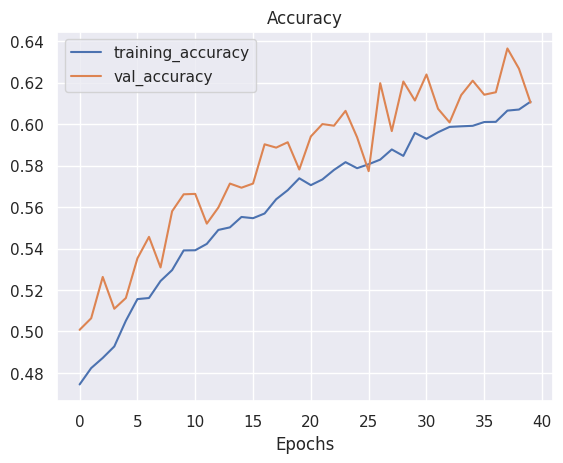

In [ ]:
plot_loss_curves(history_1)

195/195 [==============================] - 3s 13ms/step


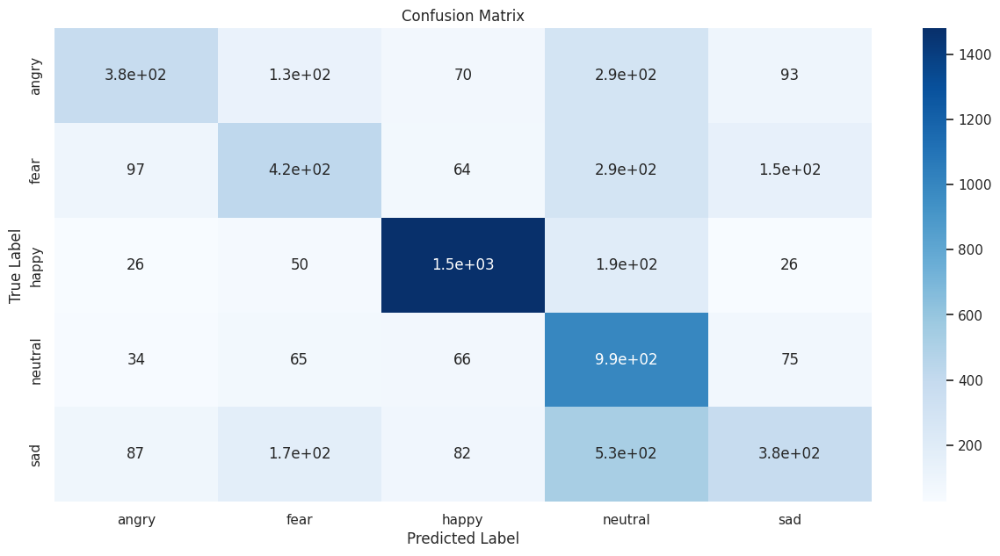

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

validation_labels = test_data.classes
validation_pred_probs = model_1.predict(test_data)
validation_pred_labels = np.argmax(validation_pred_probs, axis=1)

confusion_mtx = confusion_matrix(validation_labels, validation_pred_labels)
class_names = list(train_data.class_indices.keys())
sns.set()
plt.figure(figsize=(15, 7))
sns.heatmap(confusion_mtx, annot=True, cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
batch_size = 32

predicted_classes = np.argmax(model_1.predict(test_data,
                                            steps=int(np.ceil(test_data.samples/test_data.batch_size))), axis=1)
predicted_classes

195/195 [==============================] - 6s 28ms/step


array([3, 0, 4, ..., 3, 4, 4])

In [ ]:
cm = confusion_matrix(true_classes, predicted_classes)
cm

array([[ 380,  127,   70,  288,   93],
       [  97,  423,   64,  292,  148],
       [  26,   50, 1480,  192,   26],
       [  34,   65,   66,  993,   75],
       [  87,  171,   82,  528,  379]])

In [ ]:
report = classification_report(true_classes,
                               predicted_classes,
                               target_names=class_labels,
                               zero_division=0)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

       angry       0.61      0.40      0.48       958
        fear       0.51      0.41      0.45      1024
       happy       0.84      0.83      0.84      1774
     neutral       0.43      0.81      0.56      1233
         sad       0.53      0.30      0.39      1247

    accuracy                           0.59      6236
   macro avg       0.58      0.55      0.54      6236
weighted avg       0.61      0.59      0.58      6236



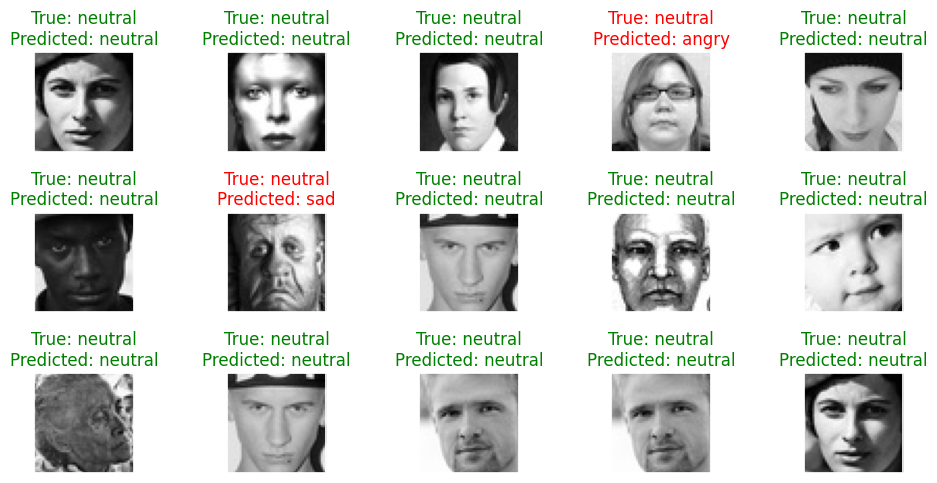

In [ ]:
# Emotion classes for the dataset
Emotion_Classes = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Assuming test_data and model_1 are already defined
batch_size = test_data.batch_size

# Selecting a random batch from the test_data
Random_batch = np.random.randint(0, len(test_data) - 1)

# Selecting random image indices from the batch
Random_Img_Index = np.random.randint(0, batch_size,15)

# Setting up the plot
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(10, 5),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    # Fetching the random image and its label
    Random_Img = test_data[Random_batch][0][Random_Img_Index[i]]
    Random_Img_Label = np.argmax(test_data[Random_batch][1][Random_Img_Index[i]], axis=0)

    # Making a prediction using the model_1
    model_1_Prediction = np.argmax(model_1.predict(tf.expand_dims(Random_Img, axis=0), verbose=0), axis=1)[0]

    # Displaying the image
    ax.imshow(Random_Img.squeeze(), cmap='gray')  # Assuming the images are grayscale
    # Setting the title with true and predicted labels, colored based on correctness
    color = "green" if Emotion_Classes[Random_Img_Label] == Emotion_Classes[model_1_Prediction] else "red"
    ax.set_title(f"True: {Emotion_Classes[Random_Img_Label]}\nPredicted: {Emotion_Classes[model_1_Prediction]}", color=color)

plt.tight_layout()
plt.show()

#MODEL_2 MobileNetV3-architecture


https://arxiv.org/pdf/2207.11238v1

https://arxiv.org/pdf/1905.02244v5


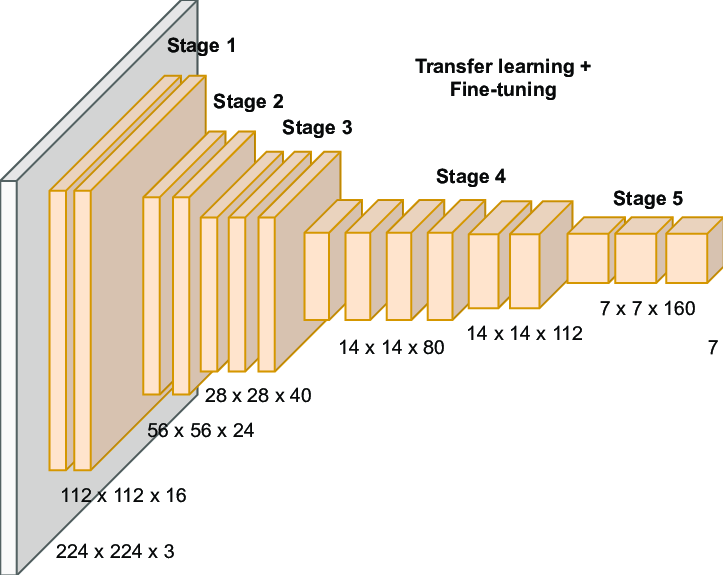

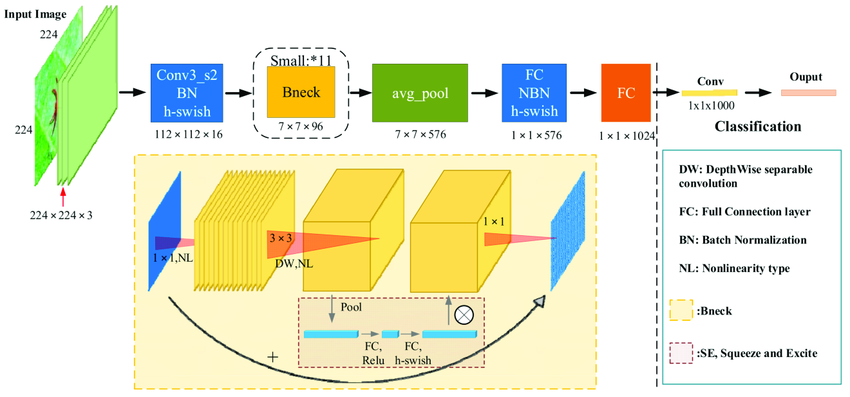

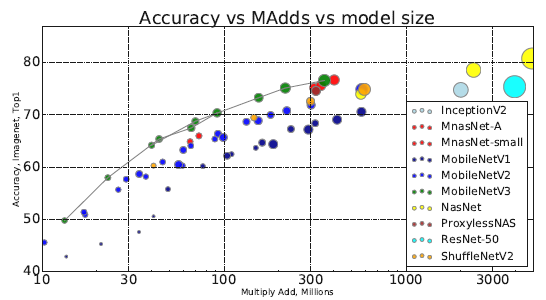

In [ ]:
import tensorflow as tf
from tensorflow.keras import  models,layers

def hard_swish(x):
    return x * layers.ReLU(6)(x + 3) / 6

def hard_sigmoid(x):
    return layers.ReLU(6)(x + 3) / 6

def bottleneck(inputs, filters, kernel_size, expansion_factor, stride, se_ratio, activation, alpha=1.0):
    input_channels = inputs.shape[-1]
    expanded_channels = int(input_channels * expansion_factor)
    x = tf.keras.layers.Conv2D(expanded_channels, 1, padding='same', use_bias=False)(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation(activation)(x)

    x = tf.keras.layers.DepthwiseConv2D(kernel_size, strides=stride, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation(activation)(x)

    if se_ratio:
        se_channels = max(1, int(input_channels * se_ratio))
        se = tf.keras.layers.GlobalAveragePooling2D()(x)
        se = tf.keras.layers.Reshape((1, 1, expanded_channels))(se)
        se = tf.keras.layers.Conv2D(se_channels, 1, padding='same', activation='relu')(se)
        se = tf.keras.layers.Conv2D(expanded_channels, 1, padding='same', activation=hard_sigmoid)(se)
        x = tf.keras.layers.Multiply()([x, se])

    x = tf.keras.layers.Conv2D(filters, 1, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)

    if stride == 1 and input_channels == filters:
        x = tf.keras.layers.Add()([inputs, x])

    return x

def MobileNetV3Large(input_shape=(48, 48, 1), alpha=1.0, num_classes=5):
    inputs = tf.keras.layers.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(16, 3, strides=2, padding='same', use_bias=False)(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = hard_swish(x)

    x = bottleneck(x, 16, 3, 1, 1, None, 'relu')
    x = bottleneck(x, 24, 3, 4, 2, None, 'relu')
    x = bottleneck(x, 24, 3, 3, 1, None, 'relu')
    x = bottleneck(x, 40, 5, 3, 2, 0.25, 'relu')
    x = bottleneck(x, 40, 5, 3, 1, 0.25, 'relu')
    x = bottleneck(x, 40, 5, 3, 1, 0.25, 'relu')
    x = bottleneck(x, 80, 3, 6, 2, None, hard_swish)
    x = bottleneck(x, 80, 3, 2.5, 1, None, hard_swish)
    x = bottleneck(x, 80, 3, 2.3, 1, None, hard_swish)
    x = bottleneck(x, 80, 3, 2.3, 1, None, hard_swish)
    x = bottleneck(x, 112, 3, 6, 1, 0.25, hard_swish)
    x = bottleneck(x, 112, 3, 6, 1, 0.25, hard_swish)
    x = bottleneck(x, 160, 5, 6, 2, 0.25, hard_swish)
    x = bottleneck(x, 160, 5, 6, 1, 0.25, hard_swish)
    x = bottleneck(x, 160, 5, 6, 1, 0.25, hard_swish)

    x = tf.keras.layers.Conv2D(960, 1, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = hard_swish(x)

    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Reshape((1, 1, 960))(x)
    x = tf.keras.layers.Conv2D(1280, 1, padding='same', use_bias=False)(x)
    x = hard_swish(x)
    x = tf.keras.layers.Conv2D(num_classes, 1, padding='same')(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Activation('softmax')(x)

    model_2 = models.Model(inputs, x)
    return model_2

model_2 = MobileNetV3Large(num_classes=5)


model_2.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0003),
                metrics=['accuracy'])


model_2.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 48, 48, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_50 (Conv2D)        │ (None, 24, 24, 16)     │            144 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_47    │ (None, 24, 24, 16)     │             64 │ conv2d_50[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_13 (Add)              │ (None, 24, 24, 16)     │              0 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 24, 24, 16)     │              0 │ add_13[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_11 (Multiply)    │ (None, 24, 24, 16)     │              0 │ batch_normalization_4… │
│                           │                        │                │ re_lu_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ true_divide_3             │ (None, 24, 24, 16)     │              0 │ multiply_11[0][0]      │
│ (TrueDivide)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_51 (Conv2D)        │ (None, 24, 24, 16)     │            256 │ true_divide_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_48    │ (None, 24, 24, 16)     │             64 │ conv2d_51[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_31             │ (None, 24, 24, 16)     │              0 │ batch_normalization_4… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ depthwise_conv2d_15       │ (None, 24, 24, 16)     │            144 │ activation_31[0][0]    │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_49    │ (None, 24, 24, 16)     │             64 │ depthwise_conv2d_15[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_32             │ (None, 24, 24, 16)     │              0 │ batch_normalization_4… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_52 (Conv2D)        │ (None, 24, 24, 16)     │            256 │ activation_32[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_50    │ (None, 24, 24, 16)     │             64 │ conv2d_52[0][0]        │
│ (BatchNormalization) 

 Total params: 2,977,275 (11.36 MB)

 Trainable params: 2,952,843 (11.26 MB)

 Non-trainable params: 24,432 (95.44 KB)

In [ ]:
!pip install pydot graphviz==0.20.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.0/47.0 kB 2.7 MB/s eta 0:00:00
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.20.3
    Uninstalling graphviz-0.20.3:
      Successfully uninstalled graphviz-0.20.3


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.509945 to fit



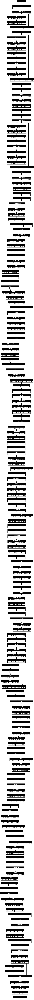

In [ ]:
tf.keras.utils.plot_model(model_2, to_file='model.png', show_shapes=True, rankdir='TB')

/usr/local/lib/python3.10/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


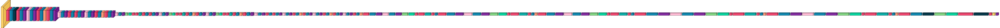

In [ ]:
visualkeras.layered_view(model_2)

In [ ]:
batch_size = 32
steps_per_epoch = train_data.samples // batch_size
validation_steps = valid_data.samples // batch_size

class DebugCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f'End of epoch {epoch}, Validation Logs: {logs}')

history_2 = model_2.fit(
    train_data,
    epochs=80,
    steps_per_epoch=steps_per_epoch,
    validation_data=valid_data,
    validation_steps=validation_steps,
    callbacks=[DebugCallback()])

Epoch 1/80
784/784 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.3000 - loss: 1.5637End of epoch 0, Validation Logs: {'accuracy': 0.2968089282512665, 'loss': 1.5638179779052734, 'val_accuracy': 0.3201121687889099, 'val_loss': 1.533192753791809}
784/784 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - accuracy: 0.3000 - loss: 1.5637 - val_accuracy: 0.3201 - val_loss: 1.5332
Epoch 2/80
  1/784 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - accuracy: 0.4062 - loss: 1.5035End of epoch 1, Validation Logs: {'accuracy': 0.40625, 'loss': 1.5035123825073242, 'val_accuracy': 0.2142857164144516, 'val_loss': 1.6634232997894287}
784/784 ━━━━━━━━━━━━━━━━━━━━ 0s 48us/step - accuracy: 0.4062 - loss: 1.5035 - val_accuracy: 0.2143 - val_loss: 1.6634
Epoch 3/80
783/784 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.3009 - loss: 1.5589End of epoch 2, Validation Logs: {'accuracy': 0.30319106578826904, 'loss': 1.557652473449707, 'val_accuracy': 0.30809295177459717, 'val_loss': 1.658273696899414}
784/784 ━━━━━━━━━━━━━━━━━━━━ 4

In [ ]:
model_2.evaluate(valid_data)

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.2443 - loss: 1.6418


[1.4920154809951782, 0.35199204087257385]

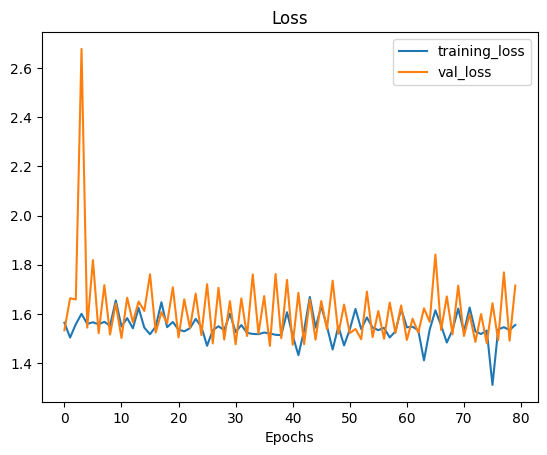

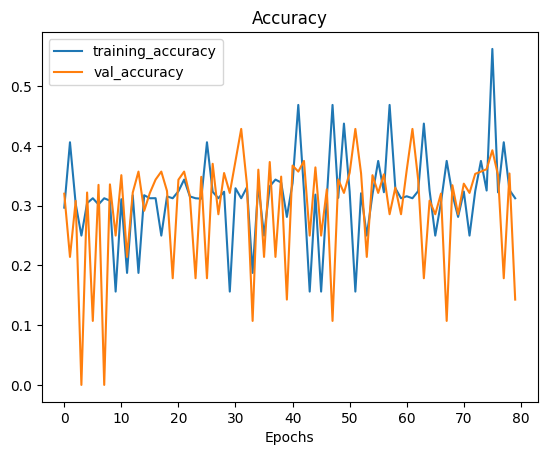

In [ ]:
plot_loss_curves(history_2)

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


195/195 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step


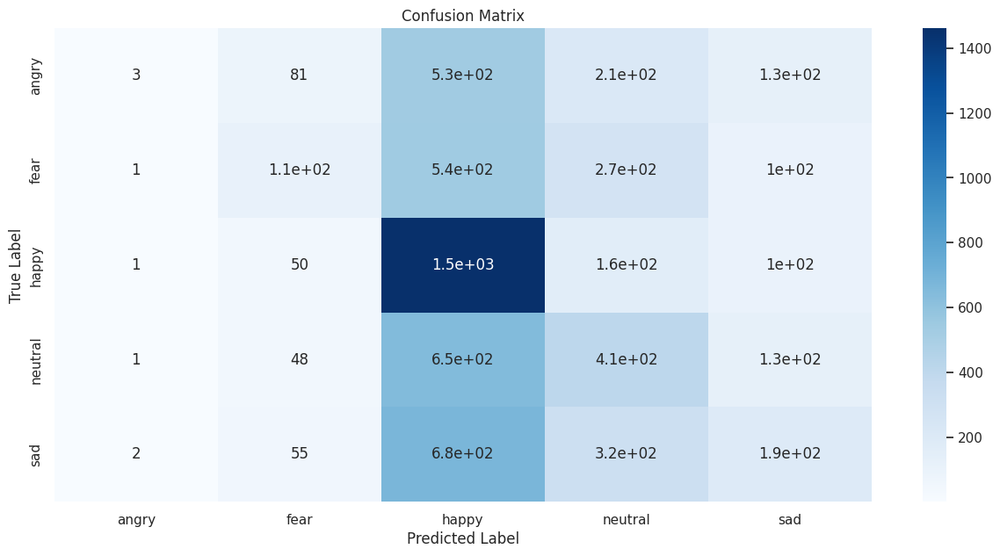

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

validation_labels = test_data.classes
validation_pred_probs = model_2.predict(test_data)
validation_pred_labels = np.argmax(validation_pred_probs, axis=1)

confusion_mtx = confusion_matrix(validation_labels, validation_pred_labels)
class_names = list(train_data.class_indices.keys())
sns.set()
plt.figure(figsize=(15, 7))
sns.heatmap(confusion_mtx, annot=True, cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
batch_size = 32

predicted_classes = np.argmax(model_2.predict(test_data,
                                            steps=int(np.ceil(test_data.samples/test_data.batch_size))), axis=1)
predicted_classes

195/195 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


array([2, 1, 4, ..., 3, 2, 2])

In [ ]:
cm = confusion_matrix(true_classes, predicted_classes)
cm

array([[   3,   81,  533,  213,  128],
       [   1,  113,  538,  270,  102],
       [   1,   50, 1461,  162,  100],
       [   1,   48,  649,  406,  129],
       [   2,   55,  676,  322,  192]])

In [ ]:
report = classification_report(true_classes,
                               predicted_classes,
                               target_names=class_labels,
                               zero_division=0)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

       angry       0.38      0.00      0.01       958
        fear       0.33      0.11      0.16      1024
       happy       0.38      0.82      0.52      1774
     neutral       0.30      0.33      0.31      1233
         sad       0.29      0.15      0.20      1247

    accuracy                           0.35      6236
   macro avg       0.33      0.28      0.24      6236
weighted avg       0.34      0.35      0.28      6236



#Model_3 Resnet50 Architecture

https://arxiv.org/pdf/1512.03385v1

https://towardsdatascience.com/the-annotated-resnet-50-a6c536034758

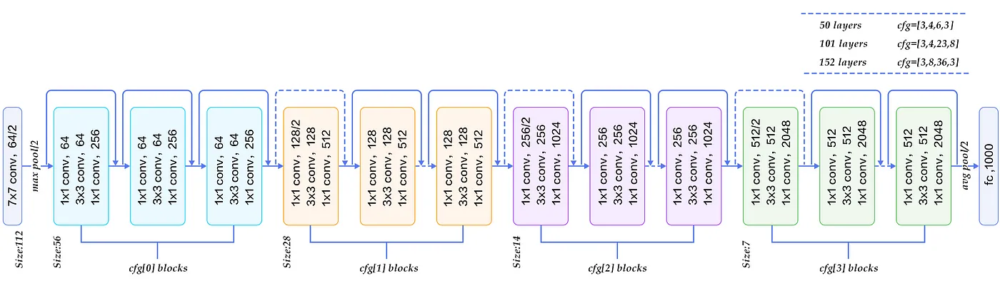

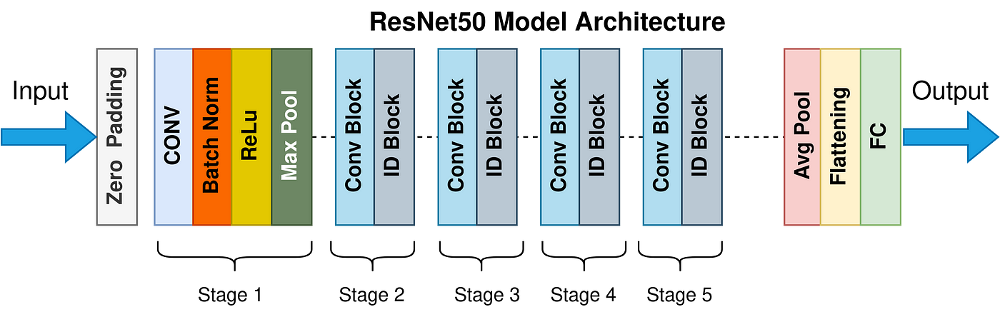

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

def identity_block(x, filters, kernel_size):
    x_shortcut = x

    # First component of the main path
    x = layers.Conv2D(filters=filters[0], kernel_size=(1, 1), strides=(1, 1), padding='valid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Second component of the main path
    x = layers.Conv2D(filters=filters[1], kernel_size=kernel_size, strides=(1, 1), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Third component of the main path
    x = layers.Conv2D(filters=filters[2], kernel_size=(1, 1), strides=(1, 1), padding='valid')(x)
    x = layers.BatchNormalization()(x)

    # Add shortcut to the main path
    x = layers.Add()([x, x_shortcut])
    x = layers.Activation('relu')(x)

    return x

def convolutional_block(x, filters, kernel_size, strides):
    x_shortcut = x

    # First component of the main path
    x = layers.Conv2D(filters=filters[0], kernel_size=(1, 1), strides=strides, padding='valid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Second component of the main path
    x = layers.Conv2D(filters=filters[1], kernel_size=kernel_size, strides=(1, 1), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Third component of the main path
    x = layers.Conv2D(filters=filters[2], kernel_size=(1, 1), strides=(1, 1), padding='valid')(x)
    x = layers.BatchNormalization()(x)

    # Shortcut path
    x_shortcut = layers.Conv2D(filters=filters[2], kernel_size=(1, 1), strides=strides, padding='valid')(x_shortcut)
    x_shortcut = layers.BatchNormalization()(x_shortcut)

    # Add shortcut to the main path
    x = layers.Add()([x, x_shortcut])
    x = layers.Activation('relu')(x)

    return x

def ResNet50(input_shape=(48,48,1), classes=5):
    x_input = layers.Input(input_shape)

    # Zero-Padding
    x = layers.ZeroPadding2D((3, 3))(x_input)

    # Stage 1
    x = layers.Conv2D(64, (7, 7), strides=(2, 2))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((3, 3), strides=(2, 2))(x)

    # Stage 2
    x = convolutional_block(x, filters=[64, 64, 256], kernel_size=(3, 3), strides=(1, 1))
    x = identity_block(x, filters=[64, 64, 256], kernel_size=(3, 3))
    x = identity_block(x, filters=[64, 64, 256], kernel_size=(3, 3))

    # Stage 3
    x = convolutional_block(x, filters=[128, 128, 512], kernel_size=(3, 3), strides=(2, 2))
    x = identity_block(x, filters=[128, 128, 512], kernel_size=(3, 3))
    x = identity_block(x, filters=[128, 128, 512], kernel_size=(3, 3))
    x = identity_block(x, filters=[128, 128, 512], kernel_size=(3, 3))

    # Stage 4
    x = convolutional_block(x, filters=[256, 256, 1024], kernel_size=(3, 3), strides=(2, 2))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))

    # Stage 5
    x = convolutional_block(x, filters=[512, 512, 2048], kernel_size=(3, 3), strides=(2, 2))
    x = identity_block(x, filters=[512, 512, 2048], kernel_size=(3, 3))
    x = identity_block(x, filters=[512, 512, 2048], kernel_size=(3, 3))

    # Average Pooling
    x = layers.AveragePooling2D((2, 2))(x)

    # Output layer
    x = layers.Flatten()(x)
    x = layers.Dense(classes, activation='softmax')(x)

    # Create model
    model_3 = models.Model(inputs=x_input, outputs=x)

    return model_3

# Define the input shape and number of classes
input_shape = (48,48,1)
classes = 5

# Build the ResNet50 model
model_3 = ResNet50(input_shape=input_shape, classes=classes)

# Compile model_3
model_3.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                metrics=['accuracy'])

# Summary of the model
model_3.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 48, 48, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 54, 54, 1)      │              0 │ input_layer_1[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_53 (Conv2D)        │ (None, 24, 24, 64)     │          3,200 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_53    │ (None, 24, 24, 64)     │            256 │ conv2d_53[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_49             │ (None, 24, 24, 64)     │              0 │ batch_normalization_5… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 11, 11, 64)     │              0 │ activation_49[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_54 (Conv2D)        │ (None, 11, 11, 64)     │          4,160 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_54    │ (None, 11, 11, 64)     │            256 │ conv2d_54[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_50             │ (None, 11, 11, 64)     │              0 │ batch_normalization_5… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_55 (Conv2D)        │ (None, 11, 11, 64)     │         36,928 │ activation_50[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_55    │ (None, 11, 11, 64)     │            256 │ conv2d_55[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_51             │ (None, 11, 11, 64)     │              0 │ batch_normalization_5… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_56 (Conv2D)        │ (None, 11, 11, 256)    │         16,640 │ activation_51[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_57 (Conv2D)        │ (None, 11, 11, 256)    │         16,640 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_56    │ (None, 11, 11, 256)    │          1,024 │ conv2d_56[0][0]        │
│ (BatchNormalization) 

 Total params: 23,591,685 (90.00 MB)

 Trainable params: 23,538,565 (89.79 MB)

 Non-trainable params: 53,120 (207.50 KB)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.863494 to fit



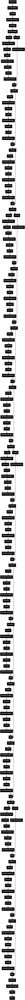

In [ ]:
tf.keras.utils.plot_model(model_3)

/usr/local/lib/python3.10/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


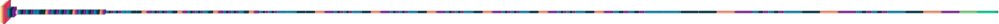

In [ ]:
visualkeras.layered_view(model_3)

In [ ]:
# import visualkeras
# from PIL import ImageFont

# # Use a custom font for the visualization (optional)
# try:
#     font = ImageFont.truetype("arial.ttf", 24)  # You can use any .ttf file
# except IOError:
#     font = None  # Fallback to the default font if the custom font is not found

# # Customize the appearance
# visualkeras.layered_view(
#     model_3,
#     to_file='advanced_model.png',  # Save to file
#     legend=True,  # Show layer types legend
#     font=font,  # Use custom font
#     spacing=40,  # Spacing between layers
#     scale_xy=2,  # Scale x and y axis
#     scale_z=2,  # Scale z axis (depth)
#     one_dim_orientation='x',  # Orientation of 1D layers ('x' or 'y')
#     #color_map=visualkeras.utils.color_maps.google_colorblind()  # Use a custom color map
# ).show()


/usr/local/lib/python3.10/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


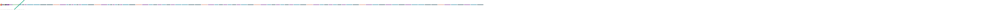

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint_callback = ModelCheckpoint(
    filepath='best_model_3.keras',  # Change the file extension to '.keras'
    monitor='val_accuracy',
    save_best_only=True,
    save_weights_only=False,
    mode='max',
    verbose=1
)

In [ ]:
steps_per_epoch = len(train_data)
validation_steps = len(valid_data)
print(steps_per_epoch)

print(validation_steps)

393
79


In [ ]:

# Example if using ImageDataGenerator with flow_from_directory
batch_size = 64  # Replace with your batch size

# Assuming train_data and valid_data are created using ImageDataGenerator
steps_per_epoch = train_data.samples // batch_size
validation_steps = valid_data.samples // batch_size

history_3 = model_3.fit(
    train_data,
    epochs=50,
    steps_per_epoch=steps_per_epoch,
    validation_data=valid_data,
    validation_steps=validation_steps,
    callbacks=[checkpoint_callback])


Epoch 1/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.3691 - loss: 1.4920
Epoch 1: val_accuracy did not improve from 0.55637
392/392 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.3692 - loss: 1.4919 - val_accuracy: 0.4830 - val_loss: 1.2401
Epoch 2/50
  1/392 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.4531 - loss: 1.2619
Epoch 2: val_accuracy did not improve from 0.55637
392/392 ━━━━━━━━━━━━━━━━━━━━ 0s 88us/step - accuracy: 0.4531 - loss: 1.2619 - val_accuracy: 0.1429 - val_loss: 1.7885
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


392/392 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.4750 - loss: 1.3084
Epoch 3: val_accuracy did not improve from 0.55637
392/392 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - accuracy: 0.4751 - loss: 1.3083 - val_accuracy: 0.5262 - val_loss: 1.4308
Epoch 4/50
  1/392 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - accuracy: 0.5938 - loss: 1.1655
Epoch 4: val_accuracy did not improve from 0.55637
392/392 ━━━━━━━━━━━━━━━━━━━━ 0s 85us/step - accuracy: 0.5938 - loss: 1.1655 - val_accuracy: 0.0714 - val_loss: 2.6419
Epoch 5/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5173 - loss: 1.2110
Epoch 5: val_accuracy did not improve from 0.55637
392/392 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5173 - loss: 1.2110 - val_accuracy: 0.4557 - val_loss: 1.3853
Epoch 6/50
  1/392 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.4531 - loss: 1.2050
Epoch 6: val_accuracy did not improve from 0.55637
392/392 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4531 - loss: 1.2050 - val_accuracy: 0.0000e+00

In [ ]:
model_3.evaluate(valid_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - accuracy: 0.6457 - loss: 0.9134


[0.984667956829071, 0.6139442324638367]

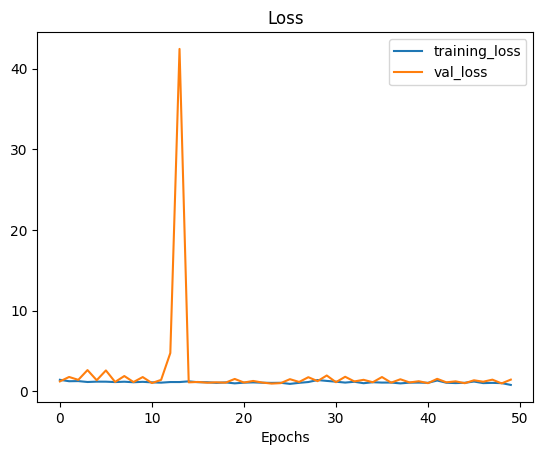

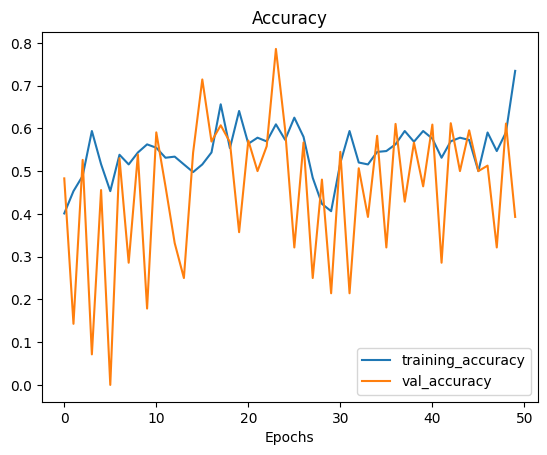

In [ ]:
plot_loss_curves(history_3)

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step


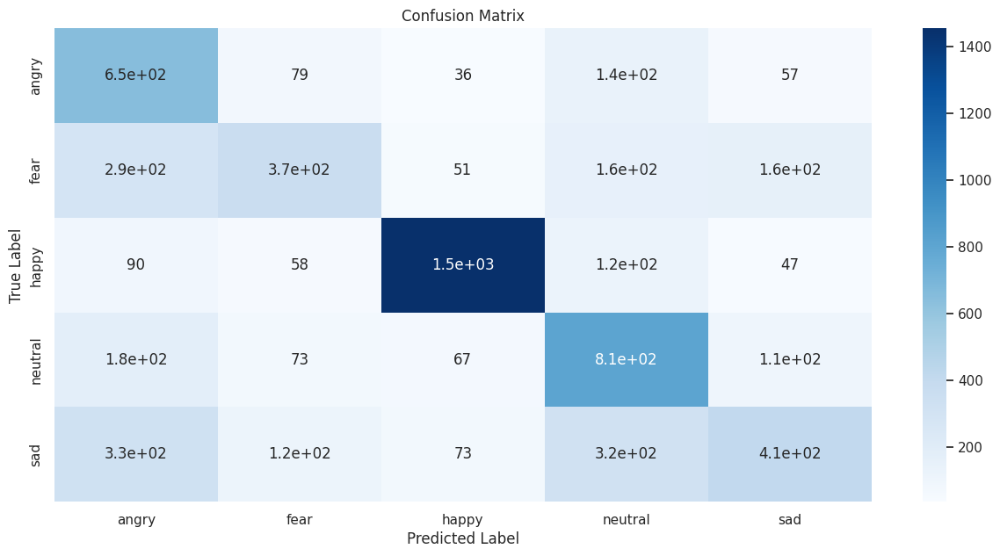

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

validation_labels = test_data.classes
validation_pred_probs = model_3.predict(test_data)
validation_pred_labels = np.argmax(validation_pred_probs, axis=1)

confusion_mtx = confusion_matrix(validation_labels, validation_pred_labels)
class_names = list(train_data.class_indices.keys())
sns.set()
plt.figure(figsize=(15, 7))
sns.heatmap(confusion_mtx, annot=True, cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
batch_size = 64

predicted_classes = np.argmax(model_3.predict(test_data,
                                            steps=int(np.ceil(test_data.samples/test_data.batch_size))), axis=1)
predicted_classes

98/98 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step


array([0, 0, 4, ..., 3, 4, 4])

In [ ]:
cm = confusion_matrix(true_classes, predicted_classes)
cm

array([[ 649,   79,   36,  137,   57],
       [ 287,  368,   51,  157,  161],
       [  90,   58, 1455,  124,   47],
       [ 179,   73,   67,  807,  107],
       [ 326,  117,   73,  321,  410]])

In [ ]:
report = classification_report(true_classes,
                               predicted_classes,
                               target_names=class_labels,
                               zero_division=0)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

       angry       0.42      0.68      0.52       958
        fear       0.53      0.36      0.43      1024
       happy       0.87      0.82      0.84      1774
     neutral       0.52      0.65      0.58      1233
         sad       0.52      0.33      0.40      1247

    accuracy                           0.59      6236
   macro avg       0.57      0.57      0.56      6236
weighted avg       0.61      0.59      0.59      6236



#PREDICTION of MODELS

#Model_0 Prediction

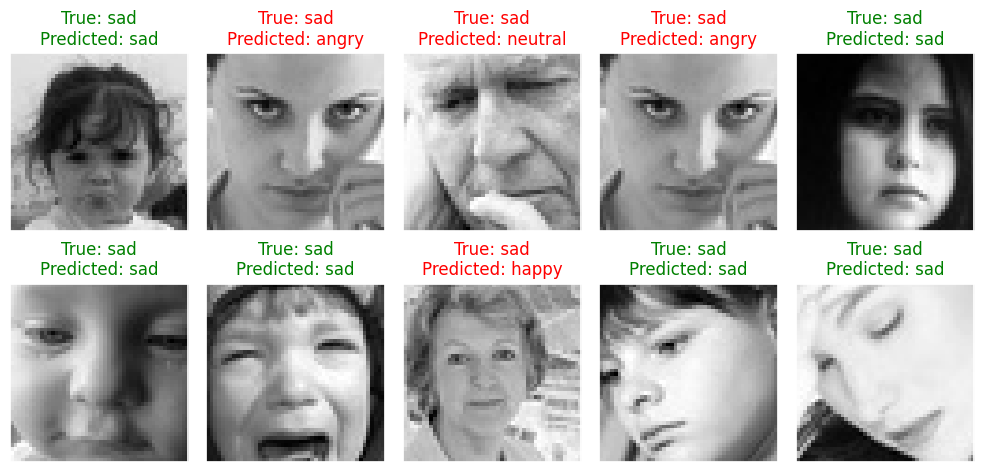

In [ ]:
# Emotion classes for the dataset
Emotion_Classes = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Assuming valid_data and model_0 are already defined
batch_size = valid_data.batch_size

# Selecting a random batch from the valid_data
Random_batch = np.random.randint(0, len(valid_data) - 1)

# Selecting random image indices from the batch
Random_Img_Index = np.random.randint(0, batch_size, 10)

# Setting up the plot
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(10, 5),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    # Fetching the random image and its label
    Random_Img = valid_data[Random_batch][0][Random_Img_Index[i]]
    Random_Img_Label = np.argmax(valid_data[Random_batch][1][Random_Img_Index[i]], axis=0)

    # Making a prediction using the model_0
    model_0_Prediction = np.argmax(model_0.predict(tf.expand_dims(Random_Img, axis=0), verbose=0), axis=1)[0]
    # Displaying the image
    ax.imshow(Random_Img.squeeze(), cmap='gray')  # Assuming the images are grayscale
    # Setting the title with true and predicted labels, colored based on correctness
    color = "green" if Emotion_Classes[Random_Img_Label] == Emotion_Classes[model_0_Prediction] else "red"
    ax.set_title(f"True: {Emotion_Classes[Random_Img_Label]}\nPredicted: {Emotion_Classes[model_0_Prediction]}", color=color)

plt.tight_layout()
plt.show()

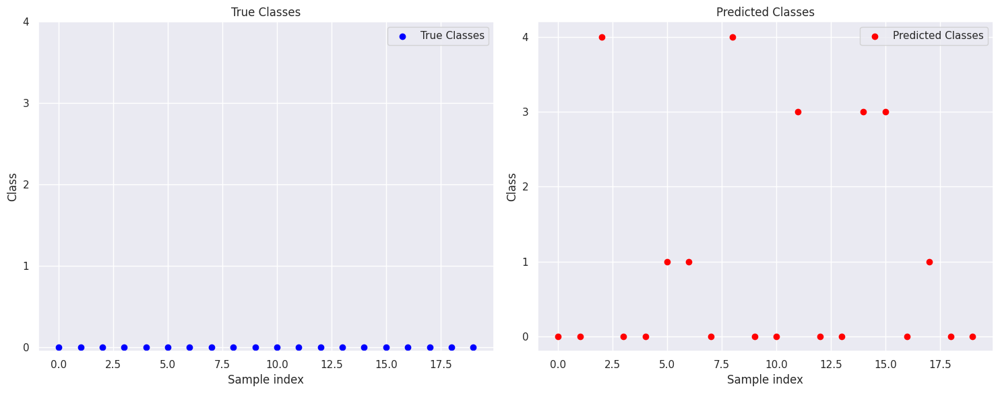

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the number of samples to visualize
num_samples = 20  # You can change this to visualize more or fewer samples

# Create a figure with two subplots
plt.figure(figsize=(15, 6))

# Plot the true classes
plt.subplot(1, 2, 1)
plt.scatter(range(num_samples), true_classes[:num_samples], c='blue', label='True Classes')
plt.title('True Classes')
plt.xlabel('Sample index')
plt.ylabel('Class')
plt.yticks(np.arange(5))  # Assuming 5 classes
plt.legend()

# Plot the predicted classes
plt.subplot(1, 2, 2)
plt.scatter(range(num_samples), predicted_classes[:num_samples], c='red', label='Predicted Classes')
plt.title('Predicted Classes')
plt.xlabel('Sample index')
plt.ylabel('Class')
plt.yticks(np.arange(5))  # Assuming 5 classes
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import cv2  # OpenCV for image display


In [ ]:
def preprocess_image(image_path, target_size=(48, 48)):
    # Load the image using OpenCV
    img_original = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img_original is None:
        raise ValueError(f"Failed to load image at path: {image_path}")

    # Resize image using OpenCV
    img_resized = cv2.resize(img_original, target_size)

    # Normalize the image
    img_resized = img_resized / 255.0

    # Expand dimensions to match model's input shape
    img_array = np.expand_dims(img_resized, axis=-1)  # Shape becomes (48, 48, 1)
    img_array = np.expand_dims(img_array, axis=0)     # Shape becomes (1, 48, 48, 1)

    return img_array, img_original


In [ ]:
def predict_image(image_path, model_0, class_names):
    # Preprocess the image
    img_array, img_original = preprocess_image(image_path)

    # Predict the class probabilities
    predictions = model_0.predict(img_array)

    # Get the predicted class
    predicted_class = np.argmax(predictions, axis=1)[0]
    predicted_class_name = class_names[predicted_class]

    return predicted_class, predicted_class_name, predictions, img_original


In [ ]:
def display_prediction(image_path, predicted_class_name, predictions, img_original):
    # Display the image
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_original, cmap='gray')
    plt.title(f"Predicted: {predicted_class_name}")
    plt.axis('off')

    # Display the predictions
    plt.subplot(1, 2, 2)
    plt.bar(range(len(predictions[0])), predictions[0])
    plt.title("Prediction Probabilities")
    plt.xlabel("Class")
    plt.ylabel("Probability")
    plt.xticks(range(len(predictions[0])))
    plt.tight_layout()
    plt.show()


In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/happy.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_0, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/angry.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_0, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)


1/1 [==============================] - 0s 17ms/step
Predicted Class: 2 - happy
Prediction Probabilities: [[0.02880021 0.00705295 0.72953135 0.18686803 0.0477474 ]]


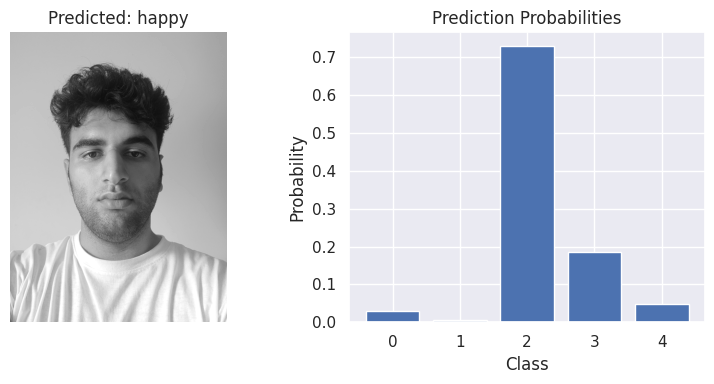

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/neutral.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_0, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")


# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)


1/1 [==============================] - 0s 31ms/step
Predicted Class: 1 - fear
Prediction Probabilities: [[0.09567995 0.27703935 0.17227024 0.178535   0.27647546]]


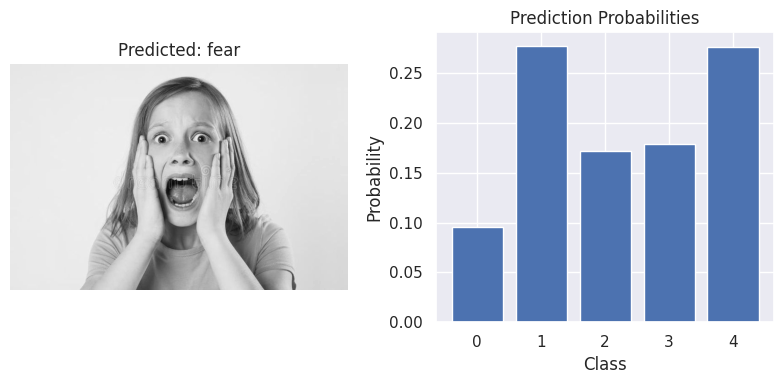

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/07796725783e84475f863e8c677ebe08.jpg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_0, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)


1/1 [==============================] - 0s 27ms/step
Predicted Class: 1 - fear
Prediction Probabilities: [[0.1214638  0.5748979  0.06459106 0.05055713 0.18849011]]


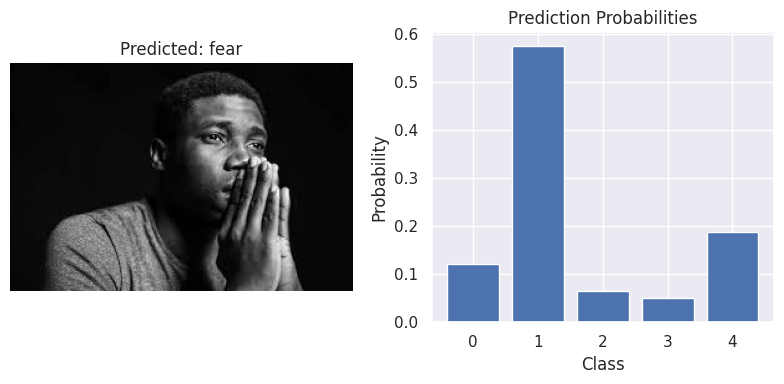

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/download.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_0, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)


#Model_1 prediction

In [ ]:
def predict_image(image_path, model_1, class_names):
    # Preprocess the image
    img_array, img_original = preprocess_image(image_path)

    # Predict the class probabilities
    predictions = model_1.predict(img_array)

    # Get the predicted class
    predicted_class = np.argmax(predictions, axis=1)[0]
    predicted_class_name = class_names[predicted_class]

    return predicted_class, predicted_class_name, predictions, img_original

1/1 [==============================] - 0s 31ms/step
Predicted Class: 2 - happy
Prediction Probabilities: [[0.04111221 0.06599545 0.44201013 0.34849006 0.10239217]]


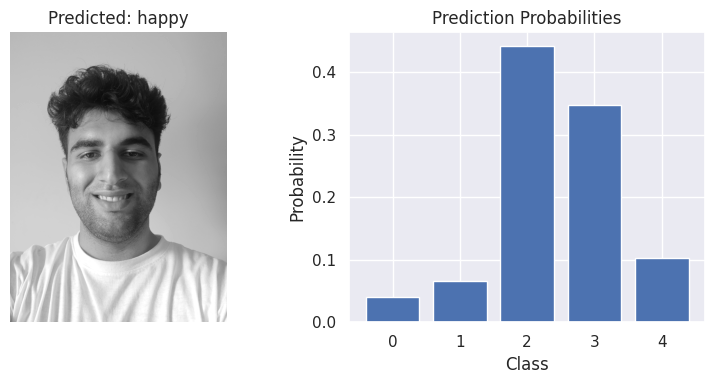

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/happy.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_1, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 [==============================] - 0s 23ms/step
Predicted Class: 3 - neutral
Prediction Probabilities: [[0.06191623 0.09089022 0.16951576 0.53012544 0.14755242]]


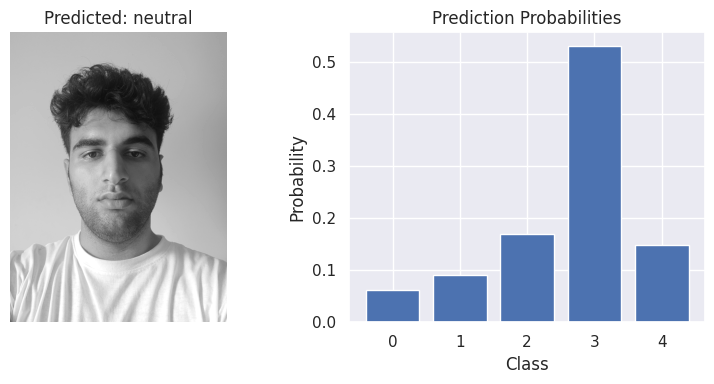

In [ ]:
#Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/neutral.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_1, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 [==============================] - 0s 29ms/step
Predicted Class: 1 - fear
Prediction Probabilities: [[0.10000764 0.51358324 0.24057995 0.07569969 0.07012948]]


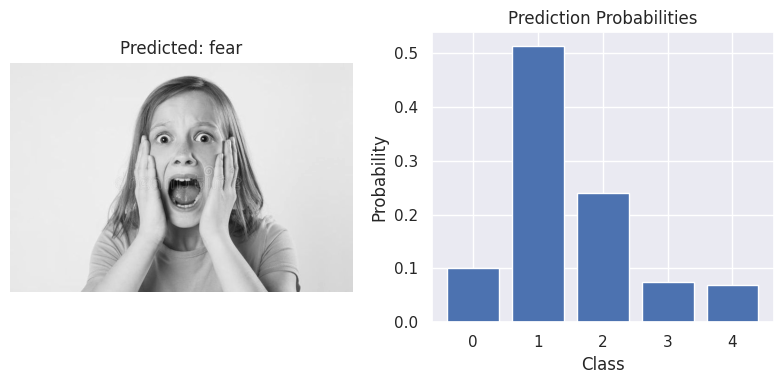

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/07796725783e84475f863e8c677ebe08.jpg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_1, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 [==============================] - 0s 20ms/step
Predicted Class: 3 - neutral
Prediction Probabilities: [[0.09924185 0.14536707 0.1375925  0.47304446 0.14475416]]


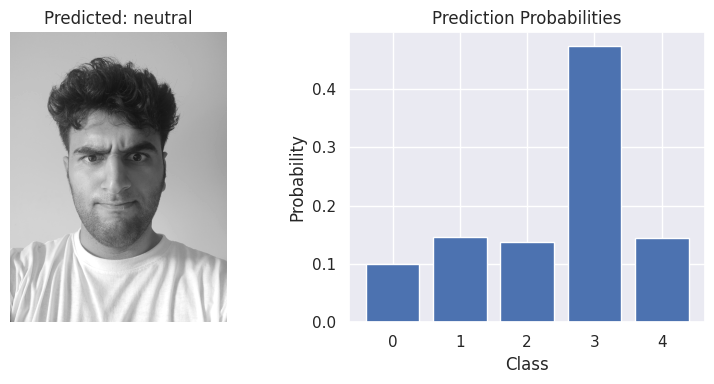

In [ ]:
#Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/angry.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_1, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 [==============================] - 0s 22ms/step
Predicted Class: 3 - neutral
Prediction Probabilities: [[0.05018999 0.13921003 0.18970892 0.48780283 0.13308819]]


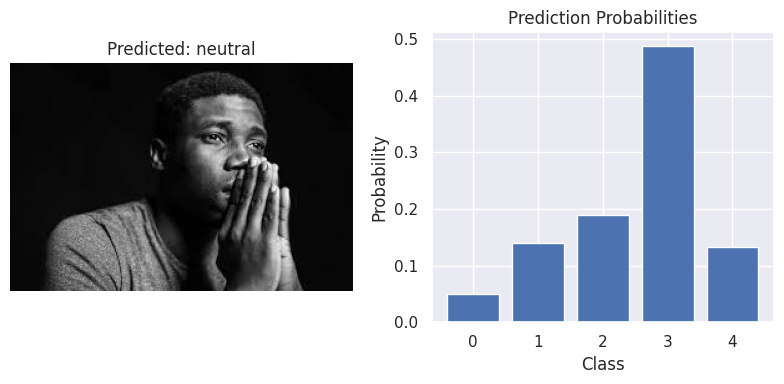

In [ ]:
#Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/download.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_1, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

#Model_2 prediction

In [ ]:
def predict_image(image_path, model_3, class_names):
    # Preprocess the image
    img_array, img_original = preprocess_image(image_path)

    # Predict the class probabilities
    predictions = model_2.predict(img_array)

    # Get the predicted class
    predicted_class = np.argmax(predictions, axis=1)[0]
    predicted_class_name = class_names[predicted_class]

    return predicted_class, predicted_class_name, predictions, img_original

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Predicted Class: 3 - neutral
Prediction Probabilities: [[0.1576454  0.17025605 0.20724256 0.24238044 0.22247544]]


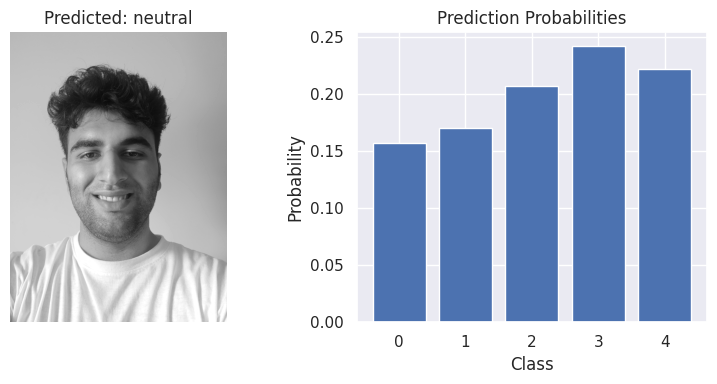

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/happy.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_2, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Predicted Class: 3 - neutral
Prediction Probabilities: [[0.15666269 0.17317437 0.1842013  0.2564118  0.22954981]]


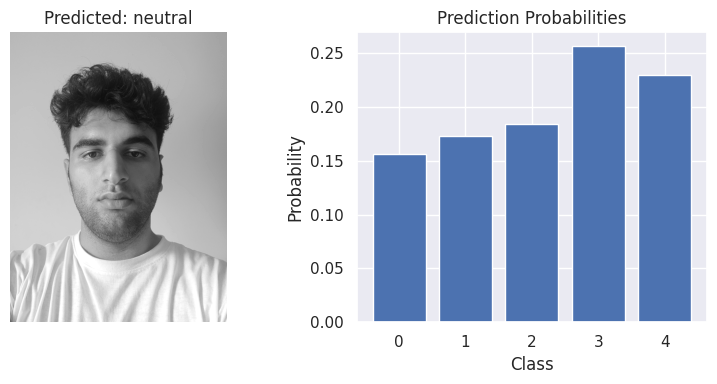

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '//content/neutral.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_2, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predicted Class: 3 - neutral
Prediction Probabilities: [[0.16057324 0.16883782 0.17274602 0.25786427 0.23997864]]


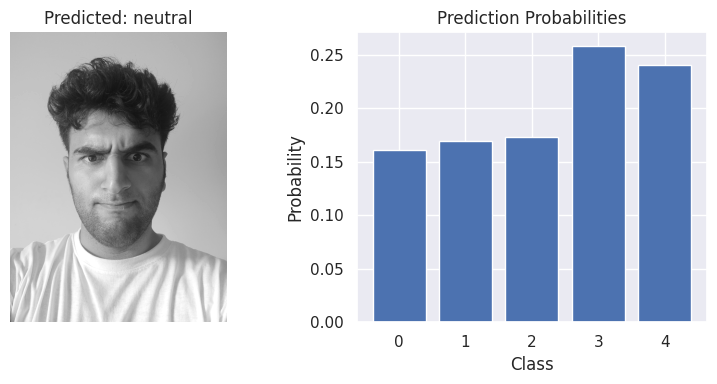

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/angry.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_2, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Predicted Class: 3 - neutral
Prediction Probabilities: [[0.13734452 0.11836021 0.21439792 0.29064918 0.23924819]]


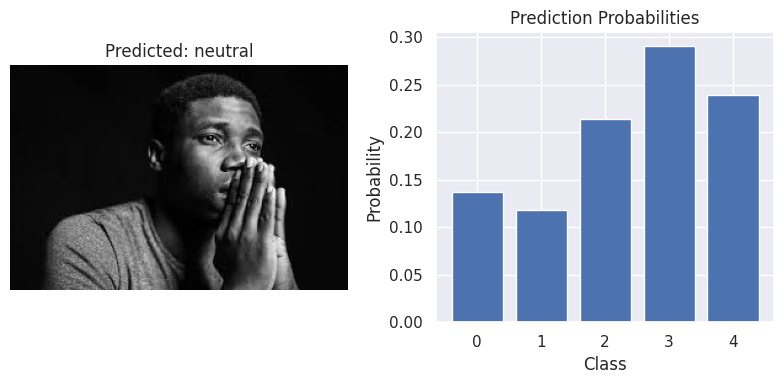

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/download.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_2, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Predicted Class: 2 - happy
Prediction Probabilities: [[0.19612117 0.2069992  0.21746746 0.16452779 0.21488437]]


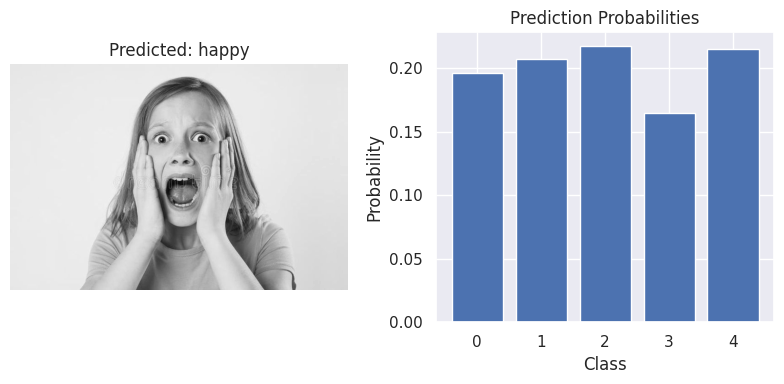

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/07796725783e84475f863e8c677ebe08.jpg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_2, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

#Model_3 prediction

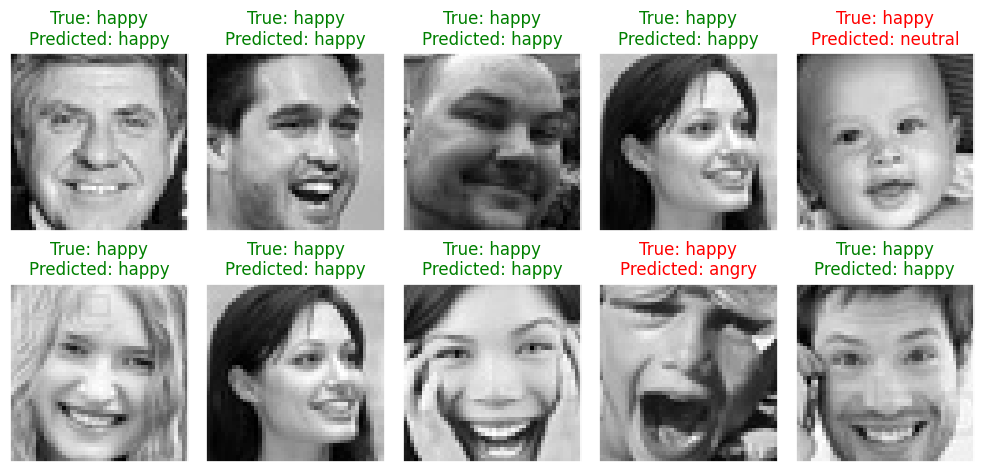

In [ ]:
# Emotion classes for the dataset
Emotion_Classes = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Assuming valid_data and model_3 are already defined
batch_size = valid_data.batch_size

# Selecting a random batch from the valid_data
Random_batch = np.random.randint(0, len(valid_data) - 1)

# Selecting random image indices from the batch
Random_Img_Index = np.random.randint(0, batch_size, 10)

# Setting up the plot
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(10, 5),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    # Fetching the random image and its label
    Random_Img = valid_data[Random_batch][0][Random_Img_Index[i]]
    Random_Img_Label = np.argmax(valid_data[Random_batch][1][Random_Img_Index[i]], axis=0)

    # Making a prediction using the model_3
    model_3_Prediction = np.argmax(model_3.predict(tf.expand_dims(Random_Img, axis=0), verbose=0), axis=1)[0]
    # Displaying the image
    ax.imshow(Random_Img.squeeze(), cmap='gray')  # Assuming the images are grayscale
    # Setting the title with true and predicted labels, colored based on correctness
    color = "green" if Emotion_Classes[Random_Img_Label] == Emotion_Classes[model_3_Prediction] else "red"
    ax.set_title(f"True: {Emotion_Classes[Random_Img_Label]}\nPredicted: {Emotion_Classes[model_3_Prediction]}", color=color)

plt.tight_layout()
plt.show()

In [ ]:
def predict_image(image_path, model_3, class_names):
    # Preprocess the image
    img_array, img_original = preprocess_image(image_path)

    # Predict the class probabilities
    predictions = model_3.predict(img_array)

    # Get the predicted class
    predicted_class = np.argmax(predictions, axis=1)[0]
    predicted_class_name = class_names[predicted_class]

    return predicted_class, predicted_class_name, predictions, img_original

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted Class: 2 - happy
Prediction Probabilities: [[0.03191924 0.03713653 0.77180165 0.08832879 0.07081375]]


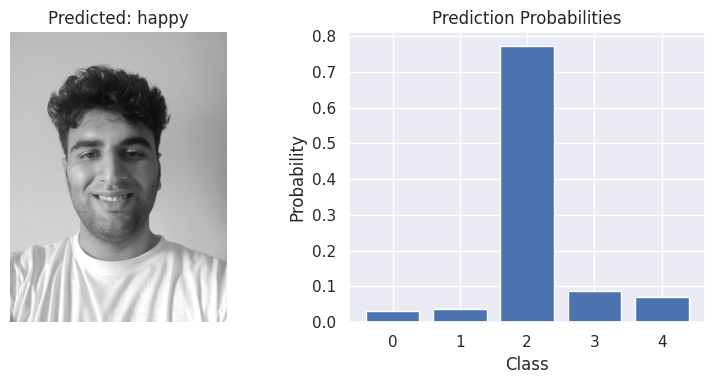

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/happy.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_3, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Predicted Class: 3 - neutral
Prediction Probabilities: [[0.05578933 0.17765985 0.21357317 0.3187674  0.23421024]]


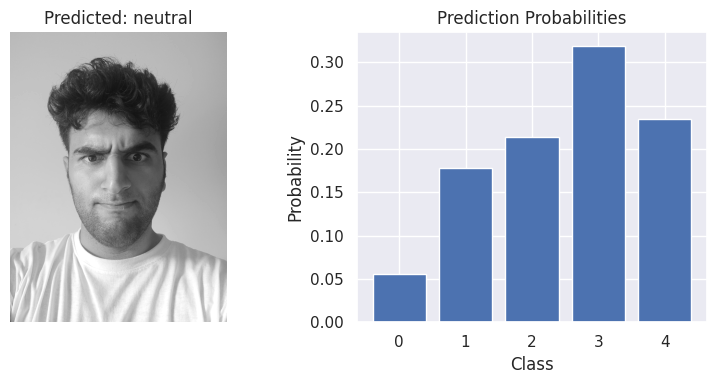

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/angry.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_3, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Class: 4 - sad
Prediction Probabilities: [[0.07826716 0.1270203  0.10422391 0.22353998 0.46694863]]


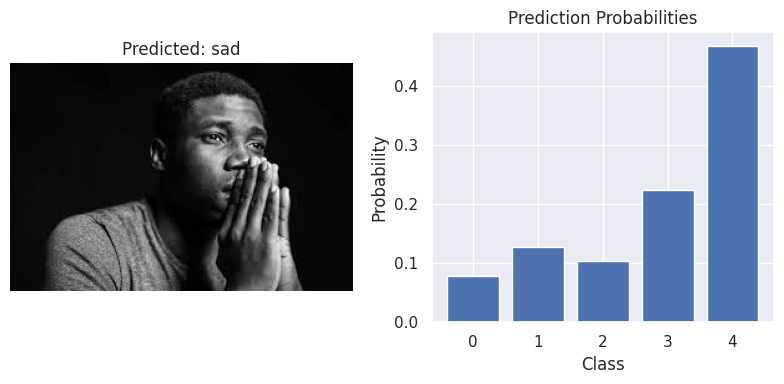

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/download.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_3, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Predicted Class: 2 - happy
Prediction Probabilities: [[0.04369631 0.12901546 0.4650998  0.19535328 0.16683511]]


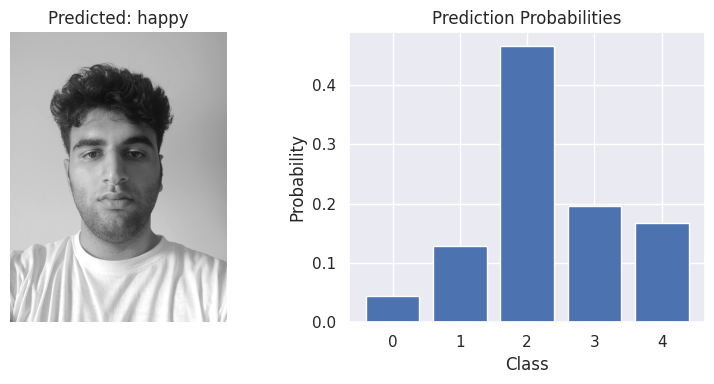

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/neutral.jpeg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_3, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Predicted Class: 1 - fear
Prediction Probabilities: [[0.08839084 0.36903968 0.1957064  0.10984244 0.23702072]]


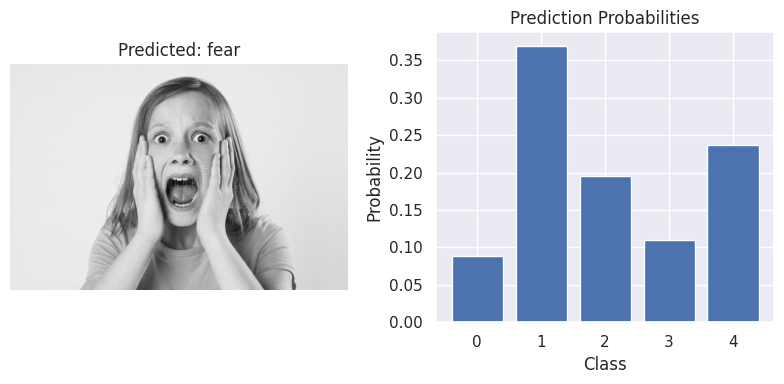

In [ ]:
# Assuming you have a list of class names
class_names = ['angry', 'fear', 'happy', 'neutral', 'sad']

# Example usage
image_path = '/content/07796725783e84475f863e8c677ebe08.jpg'
predicted_class, predicted_class_name, predictions, img_original = predict_image(image_path, model_3, class_names)
print(f"Predicted Class: {predicted_class} - {predicted_class_name}")
print(f"Prediction Probabilities: {predictions}")

# Display results
display_prediction(image_path, predicted_class_name, predictions, img_original)